<a href="https://colab.research.google.com/github/momenashra/Data_science/blob/time-series-forecasting/Cyshield_Time_series_analysis_submission.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data reading and preprocessing

## Reading data

In [1]:
#loading libararies
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
df = pd.read_csv("/content/drive/MyDrive/CYSHIELD_TASK.csv")

In [5]:
df.head()

,quantity,UnitePrice,discount,date,retail price,product_name,area,city
0,33,16.0,20.0,2021-10-29T03:33:52Z,16.0,product y,Bahary,North
1,30,16.0,20.0,2021-10-23T12:29:27Z,16.0,product y,Dar El-Salam,Cairo
2,2,45.0,30.0,2021-08-03T09:14:16Z,45.0,product z,Miamy,North
3,3,16.0,3.0,2021-08-17T09:00:50Z,16.0,product y,Miamy,North
4,1,45.0,27.0,2021-09-06T19:57:02Z,45.0,product z,Miamy,North


In [6]:
df["city"].value_counts()

,count
city,
North,1747
Cairo,704
Giza,544


## Edit data format , indexing and sorting

In [7]:
#ensure the date column is in datetime64 format.
df['date'] = pd.to_datetime(df['date'])
#convert from the datetime64 object, leaving only the date for easier processing and readability .
df['date'] = df['date'].dt.date
# Sort the DataFrame by 'Date'
df = df.sort_values(by='date')
# Set 'Date' as the index
df.set_index('date', inplace=True)

# Exploratory Data Analysis

## Data overview

In [8]:
df.head()

,quantity,UnitePrice,discount,retail price,product_name,area,city
date,,,,,,,
2021-03-31,5,102.0,33.0,102.0,product x,El-Mokattam,Cairo
2021-04-30,1,16.0,9.0,16.0,product y,Ain Shams,Cairo
2021-05-08,10,16.0,9.0,16.0,product y,El-Zaitoun,Cairo
2021-05-08,10,45.0,22.0,45.0,product z,El-Zaitoun,Cairo
2021-05-22,10,16.0,20.0,16.0,product y,Bakos,North


In [9]:
df.describe()

,quantity,UnitePrice,discount,retail price
count,2995.000000,2995.000000,2995.000000,2995.000000
mean,7.705509,60.555426,25.917225,59.615776
std,100.466019,35.270286,14.124298,36.944778
min,1.000000,10.000000,-1.000000,0.000000
25%,2.000000,16.000000,20.000000,16.000000
50%,3.000000,45.000000,31.000000,45.000000
75%,5.000000,99.000000,33.000000,99.000000
max,5000.000000,102.000000,561.000000,102.000000



*   obviously there are outilers in data since max is far from
3rd quantile in quantity and discount .
*   discount here is percentage we must impute any row with discount > 100 or <0 .



In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2995 entries, 2021-03-31 to 2023-01-17
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   quantity      2995 non-null   int64  
 1   UnitePrice    2995 non-null   float64
 2   discount      2995 non-null   float64
 3   retail price  2995 non-null   float64
 4   product_name  2995 non-null   object 
 5   area          2970 non-null   object 
 6   city          2995 non-null   object 
dtypes: float64(3), int64(1), object(3)
memory usage: 187.2+ KB


In [11]:
area_frequency = df['area'].value_counts()
area_frequency
#not icluding nan

,count
area,
El-Agamy,301
El-Seyouf,300
Nasr City,272
Sidy Bishr,158
El-Sheikh Zayed,151
...,...
Helwan,1
Al Sulaimaniyah,1
Marsa Matrouh,1


* High cardanality .


## Data cleaning

In [12]:
df.isnull().sum()  # Shows the count of missing values per column

,0
quantity,0
UnitePrice,0
discount,0
retail price,0
product_name,0
area,25
city,0


* I will Get realation between area and city (two categorical features) to check  .

In [13]:
from scipy.stats import chi2_contingency
contingency_table = pd.crosstab(df['area'], df['city'])
chi2, p, dof, expected = chi2_contingency(contingency_table)
p

0.0


*   intuitively area is not importatnt feature since it doesn't effect our forecasting for each city and highly correlated with city feature (p=0) .

In [14]:
df.drop(columns=['area'], inplace=True)

In [15]:
# Calculate the correlation between two specific features
feature_1 =  'UnitePrice'
feature_2 = 'retail price'
spearman_corr = df[feature_1].corr(df[feature_2], method='spearman')
#used spearman INSTEAD of pearson since data has outliers and skwed and distrbution is not normal
# Display the correlation
print(f"Correlation between {feature_1} and {feature_2}: {spearman_corr:.2f}")

Correlation between UnitePrice and retail price: 0.88



*   result suggests multicollinearity (correlationn ~ 0.9 ).
*   for further check i will check causality .



In [16]:
from statsmodels.tsa.stattools import grangercausalitytests
max_lag = 5
df_diff = df[[feature_1, feature_2]].diff().dropna()

# Run Granger test on differenced data
gc_result = grangercausalitytests(df_diff, max_lag, verbose=True)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7293  , p=0.3932  , df_denom=2990, df_num=1
ssr based chi2 test:   chi2=0.7300  , p=0.3929  , df=1
likelihood ratio test: chi2=0.7299  , p=0.3929  , df=1
parameter F test:         F=0.7293  , p=0.3932  , df_denom=2990, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.4087  , p=0.2446  , df_denom=2987, df_num=2
ssr based chi2 test:   chi2=2.8222  , p=0.2439  , df=2
likelihood ratio test: chi2=2.8209  , p=0.2440  , df=2
parameter F test:         F=1.4087  , p=0.2446  , df_denom=2987, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.9875  , p=0.3976  , df_denom=2984, df_num=3
ssr based chi2 test:   chi2=2.9695  , p=0.3964  , df=3
likelihood ratio test: chi2=2.9680  , p=0.3966  , df=3
parameter F test:         F=0.9875  , p=0.3976  , df_denom=2984, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.0308  , p=0.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


*   causality test must be performed in stationary data and it doesn't have strong causality (predictive realtionship) but we will keep both features espacially it may help with dynamic models (tree based).
*   Note : after removing retail_price feature model performance did't change significantly .


In [17]:
df.drop(columns=['retail price'], inplace=True)

In [18]:
#adding new feature total price to enhace relation between unit price and quantity
df['total_price'] = df['UnitePrice'] * df['quantity'] * (1 - df['discount']/100)


*   by using tree-based models, which handle feature interactions better, 'total_price' may  provide value. since tree-based models are less sensitive to multicollinearity and can benefit from the combined financial information in 'total_price'.




###Removing outliers using IQR technique

In [19]:
columns_to_check = ['quantity', 'UnitePrice', 'discount']
df_filtered = df.copy()  # Copy the original DataFrame to keep it intact
def detect_outliers_iqr(column, tolerance=18):
    Q1 = column.quantile(0.25)
    Q3 = column.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - tolerance * IQR
    upper_bound = Q3 + tolerance * IQR
    return column[(column < lower_bound) | (column > upper_bound)]
#Dictionary to append outliers
outliers_dict = {}
# here i replaced standard 1.5 with bigger tolarance to preserve sufficient amout of data
# with 1.5 as the tolerance value our data was only around 750 rows and with 18 around 2250 .
for col in columns_to_check :
    outliers = detect_outliers_iqr(df[col])
    outliers_dict[col] = outliers.tolist()
    df_filtered = df_filtered[~df_filtered.index.isin(outliers.index)]



In [20]:
outliers_dict

{'quantity': [100,
  1000,
  5000,
  2000,
  100,
  200,
  232,
  100,
  200,
  60,
  100,
  100,
  100,
  100,
  100,
  60],
 'UnitePrice': [],
 'discount': [561.0]}

In [21]:
df.describe()

,quantity,UnitePrice,discount,total_price
count,2995.000000,2995.000000,2995.000000,2995.000000
mean,7.705509,60.555426,25.917225,218.778564
std,100.466019,35.270286,14.124298,1602.933895
min,1.000000,10.000000,-1.000000,-2068.737500
25%,2.000000,16.000000,20.000000,62.825000
50%,3.000000,45.000000,31.000000,94.500000
75%,5.000000,99.000000,33.000000,183.600000
max,5000.000000,102.000000,561.000000,79200.000000


*  After removing outliers i observed more outliers which i didn't hanle using IQR since i have big tolarnce to keep sufficient amout of data so i have droped unfamiliar values using manual filters .


In [22]:
#column to check for outliers
columns_to_check= ['UnitePrice','discount','total_price']
# Collect indices of rows to be dropped
rows_to_drop = []
# Iterate over each row using index and row content
for index, row in df_filtered[columns_to_check].iterrows():
    # Check if any value in the row is less than or equal to 0
     if (row[['UnitePrice','total_price']] <= 0).any() or row['discount'] < 0 :
        # Add the index to the list of rows to be dropped
        rows_to_drop.append(index)

# Drop all collected rows at once
df_filtered.drop(index=rows_to_drop, inplace=True)

In [23]:
df_filtered.describe()

,quantity,UnitePrice,discount,total_price
count,2801.000000,2801.000000,2801.000000,2801.000000
mean,4.457694,60.928329,25.729986,160.185021
std,6.043155,35.198251,10.113754,220.268168
min,1.000000,10.000000,0.000000,12.800000
25%,2.000000,16.000000,20.000000,62.400000
50%,3.000000,45.000000,31.000000,94.500000
75%,5.000000,99.000000,33.000000,183.090000
max,50.000000,102.000000,38.000000,3051.500000


In [24]:
df_filtered.head()

,quantity,UnitePrice,discount,product_name,city,total_price
date,,,,,,
2021-03-31,5,102.0,33.0,product x,Cairo,341.70
2021-04-30,1,16.0,9.0,product y,Cairo,14.56
2021-05-08,10,16.0,9.0,product y,Cairo,145.60
2021-05-08,10,45.0,22.0,product z,Cairo,351.00
2021-05-22,10,16.0,20.0,product y,North,128.00


<Axes: >

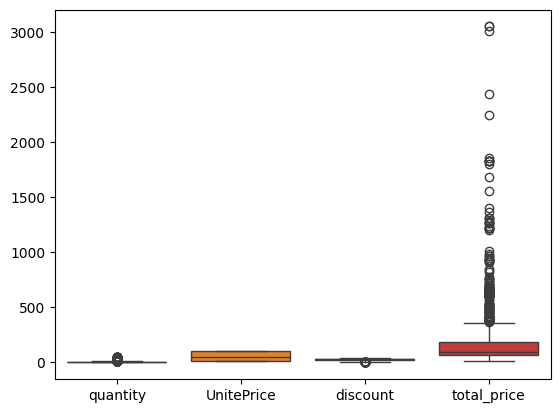

In [25]:
sns.boxplot(data=df_filtered)

* some outliers i have choosen to keep to preserve sufficient amount of data .

##Univariate Analysis

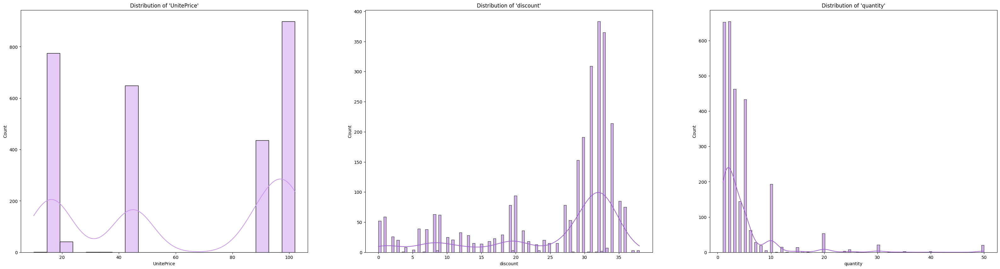

In [26]:
fig, axes = plt.subplots(1, 3, figsize = (40, 10))

sns.histplot(ax = axes[0], x = df_filtered["UnitePrice"],
             bins = 20,
             kde = True,
             cbar = True,
             color = "#CA96EC").set(title = "Distribution of 'UnitePrice'");

sns.histplot(ax = axes[1], x = df_filtered["discount"],
             bins = 100,
             cbar = True,
             kde = True,
             color = "#A163CF").set(title = "Distribution of 'discount'");
# sns.histplot(ax = axes[2], x = df_filtered["retail price"],
#              bins = 20,
#              kde = True,
#              cbar = True,
#              color = "#CA96EC").set(title = "Distribution of 'retail price'");

sns.histplot(ax = axes[2], x = df_filtered["quantity"],
             bins = 100,
             cbar = True,
             kde = True,
             color = "#A163CF").set(title = "Distribution of 'quantity'");


* Features looks Non-Normally distributed (heavy tailed due to outliers) .

<Axes: xlabel='date', ylabel='quantity'>

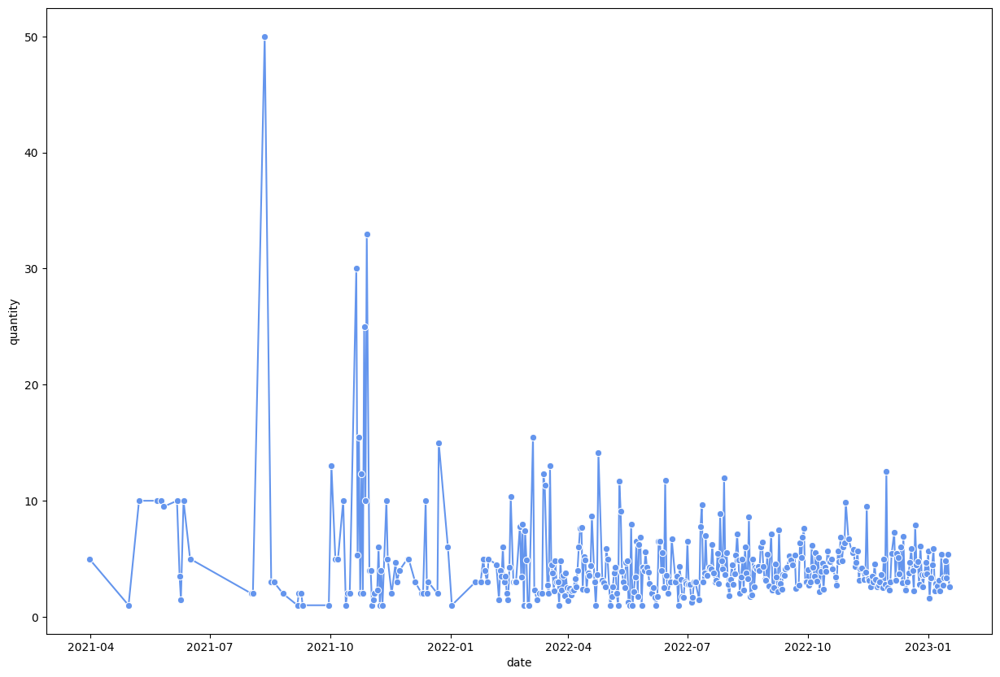

In [27]:
### Visualize time series ###
fig, ax = plt.subplots(figsize=(15, 10))
sns.lineplot(x=df_filtered.index, y=df_filtered["quantity"], color='cornflowerblue', marker='o',errorbar=None)


## Multivariate Analysis


In [28]:
# Create a pivot table to see data more clearly and make some relation between categorical data
pivot_df = df_filtered.pivot_table(
    index='date',
    columns=['product_name','city'],
    values=['quantity', 'UnitePrice', 'discount','total_price'],
    aggfunc='sum',
    fill_value=0
)

for column in pivot_df.columns.get_level_values(0).unique():
    if column in ['quantity', 'discount']:
        pivot_df[column] = pivot_df[column].fillna(0)  # Assume no activity = 0
    elif column in ['UnitePrice']:
        pivot_df[column] = pivot_df[column].ffill()  # Forward fill stable prices
    elif column == 'total_price':
        pivot_df[column] = pivot_df[column].interpolate(method='linear')  # Smooth trends

pivot_df.columns = ['_'.join(col).strip() for col in pivot_df.columns.values]

# Reset the index
pivot_df.reset_index(inplace=True)


In [29]:
pivot_df

,date,UnitePrice_product x _Cairo,UnitePrice_product x _Giza,UnitePrice_product x _North,UnitePrice_product y_Cairo,UnitePrice_product y_Giza,UnitePrice_product y_North,UnitePrice_product z_Cairo,UnitePrice_product z_Giza,UnitePrice_product z_North,...,quantity_product z_North,total_price_product x _Cairo,total_price_product x _Giza,total_price_product x _North,total_price_product y_Cairo,total_price_product y_Giza,total_price_product y_North,total_price_product z_Cairo,total_price_product z_Giza,total_price_product z_North
0,2021-03-31,102.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,341.70,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.0
1,2021-04-30,0.0,0.0,0.0,16.0,0.0,0.0,0.0,0.0,0.0,...,0,0.00,0.00,0.00,14.56,0.0,0.0,0.00,0.00,0.0
2,2021-05-08,0.0,0.0,0.0,16.0,0.0,0.0,45.0,0.0,0.0,...,0,0.00,0.00,0.00,145.60,0.0,0.0,351.00,0.00,0.0
3,2021-05-22,0.0,0.0,0.0,0.0,0.0,16.0,0.0,0.0,0.0,...,0,0.00,0.00,0.00,0.00,0.0,128.0,0.00,0.00,0.0
4,2021-05-25,0.0,0.0,0.0,0.0,0.0,16.0,0.0,0.0,0.0,...,0,0.00,0.00,0.00,0.00,0.0,155.2,0.00,0.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
383,2023-01-13,0.0,99.0,198.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.00,331.65,333.63,0.00,0.0,0.0,0.00,0.00,0.0
384,2023-01-14,198.0,297.0,396.0,0.0,38.0,90.0,0.0,45.0,45.0,...,1,392.04,409.86,331.65,0.00,156.4,464.4,0.00,931.50,31.5
385,2023-01-15,99.0,0.0,396.0,22.0,38.0,0.0,45.0,90.0,0.0,...,0,265.32,0.00,399.96,171.60,155.8,0.0,95.85,130.05,0.0
386,2023-01-16,0.0,0.0,594.0,0.0,0.0,22.0,45.0,0.0,135.0,...,11,0.00,0.00,2345.31,0.00,0.0,167.2,95.85,0.00,355.5


* Sparsity in data will make model lazy to learn .

### Correlation map


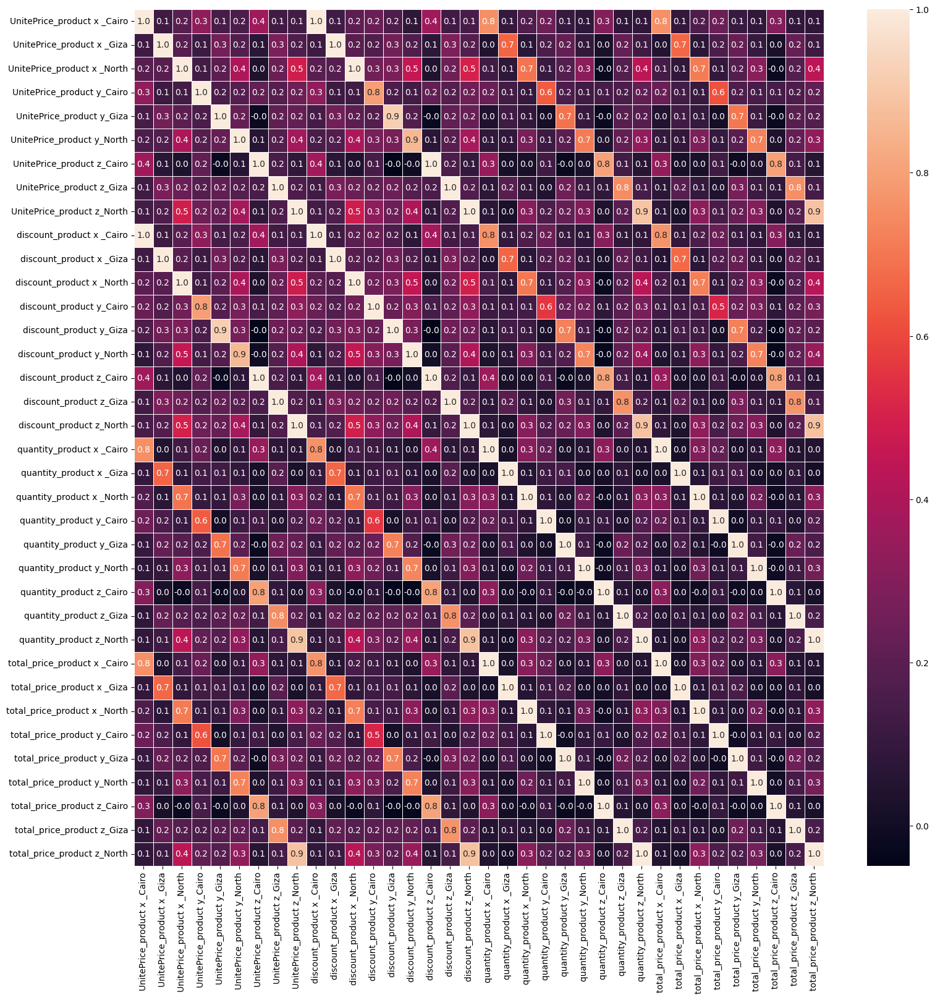

In [30]:
f,ax = plt.subplots(figsize=(18, 18))
sns.heatmap(pivot_df.drop(columns=['date']).corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax)
plt.show()

### Pair plot

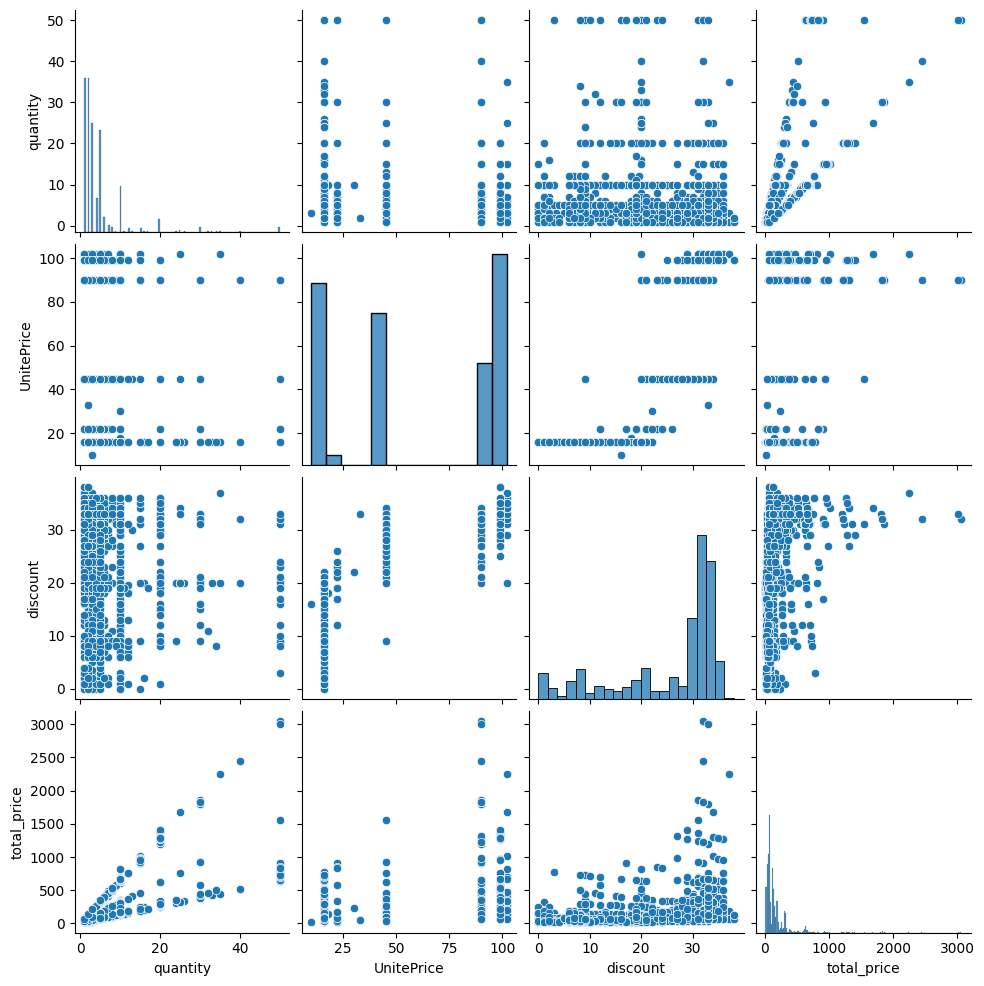

In [31]:
sns.pairplot(df_filtered)



* Features relations doesn't have a clear pattern .

### lineplot

In [32]:
# Select output columns from pivot DataFrame
out_cols=['quantity_product x _Cairo', 'quantity_product x _Giza',
          'quantity_product x _North', 'quantity_product y_Cairo',
          'quantity_product y_Giza'  , 'quantity_product y_North',
          'quantity_product z_Cairo' , 'quantity_product z_Giza',
          'quantity_product z_North']

In [33]:
#strip white spaces in columns names
pivot_df.iloc[:, 1:] = pivot_df.iloc[:, 1:].apply(lambda x: x.str.strip() if x.dtype == 'object' else x)

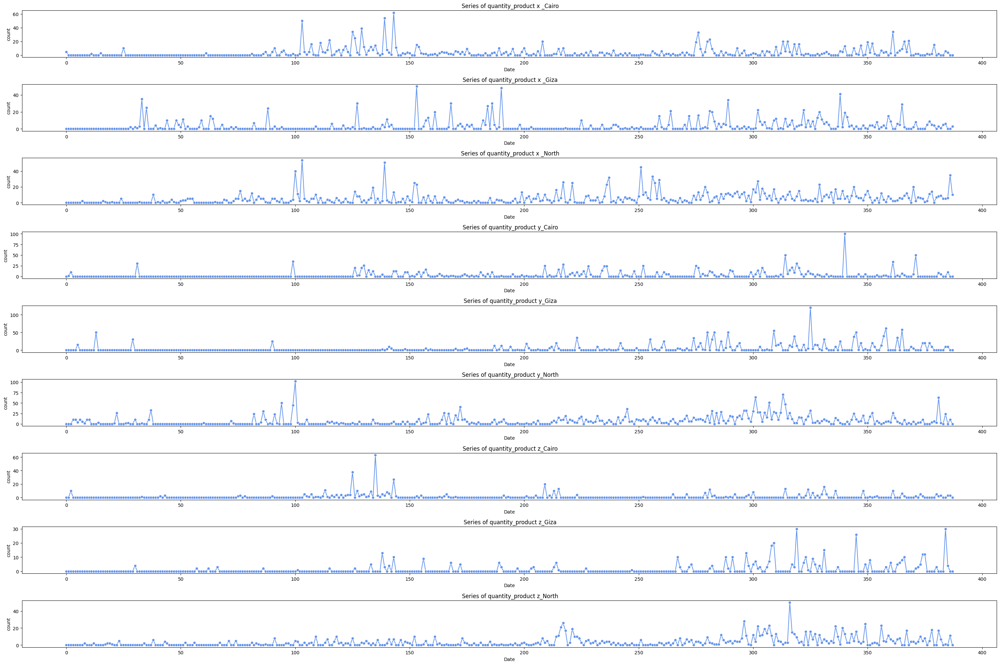

In [34]:
# Create a figure with as many subplots as the number of out_cols
fig, ax = plt.subplots(nrows=len(out_cols), ncols=1, figsize=(30, 20))
# Loop over your target columns (out_cols) and create one plot for each
for i in range(len(out_cols)):
    sns.lineplot(x=pivot_df.index, y=pivot_df[out_cols[i]], ax=ax[i], color='cornflowerblue', marker='o')
    ax[i].set_title(f" Series of {out_cols[i]}")
    ax[i].set_xlabel('Date')
    ax[i].set_ylabel("count")

# Adjust layout to ensure plots are spaced properly
plt.tight_layout()

# Display the plot
plt.show()



**Observations :**
*   Product X is the most popular .
*   Seasonality and cycle isn't clear .
*   Data has spikes (high sales) .



## Time Series Analysis

In [35]:
# import libararies for Time series forecasting
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.preprocessing import RobustScaler


### Data resampling

* As data isn't uniformaly spaced so we should resample it as a daily frequency to check for stationarity , seasonality and trend patterns .
* I will resample data at daily frequency since i will predict 10 days in advance.

In [36]:
pivot_df_resampled=pivot_df.copy()
pivot_df_resampled['date'] = pd.to_datetime(pivot_df_resampled['date'])
pivot_df_resampled.set_index('date', inplace=True)

# Resample to daily frequency
pivot_df_resampled = pivot_df_resampled.resample('D').mean()

# # Handle missing values by interpolation
pivot_df_resampled.interpolate(method='linear', inplace=True)
# # i have tried second degree interpolation and make bad results and time does not change results .

In [37]:
pivot_df_resampled

,UnitePrice_product x _Cairo,UnitePrice_product x _Giza,UnitePrice_product x _North,UnitePrice_product y_Cairo,UnitePrice_product y_Giza,UnitePrice_product y_North,UnitePrice_product z_Cairo,UnitePrice_product z_Giza,UnitePrice_product z_North,discount_product x _Cairo,...,quantity_product z_North,total_price_product x _Cairo,total_price_product x _Giza,total_price_product x _North,total_price_product y_Cairo,total_price_product y_Giza,total_price_product y_North,total_price_product z_Cairo,total_price_product z_Giza,total_price_product z_North
date,,,,,,,,,,,,,,,,,,,,,
2021-03-31,102.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,33.0,...,0.0,341.70,0.00,0.00,0.000000,0.0,0.0,0.00,0.00,0.0
2021-04-01,98.6,0.0,0.0,0.533333,0.0,0.0,0.0,0.0,0.0,31.9,...,0.0,330.31,0.00,0.00,0.485333,0.0,0.0,0.00,0.00,0.0
2021-04-02,95.2,0.0,0.0,1.066667,0.0,0.0,0.0,0.0,0.0,30.8,...,0.0,318.92,0.00,0.00,0.970667,0.0,0.0,0.00,0.00,0.0
2021-04-03,91.8,0.0,0.0,1.600000,0.0,0.0,0.0,0.0,0.0,29.7,...,0.0,307.53,0.00,0.00,1.456000,0.0,0.0,0.00,0.00,0.0
2021-04-04,88.4,0.0,0.0,2.133333,0.0,0.0,0.0,0.0,0.0,28.6,...,0.0,296.14,0.00,0.00,1.941333,0.0,0.0,0.00,0.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-13,0.0,99.0,198.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.00,331.65,333.63,0.000000,0.0,0.0,0.00,0.00,0.0
2023-01-14,198.0,297.0,396.0,0.000000,38.0,90.0,0.0,45.0,45.0,68.0,...,1.0,392.04,409.86,331.65,0.000000,156.4,464.4,0.00,931.50,31.5
2023-01-15,99.0,0.0,396.0,22.000000,38.0,0.0,45.0,90.0,0.0,33.0,...,0.0,265.32,0.00,399.96,171.600000,155.8,0.0,95.85,130.05,0.0


* After resampling i observed more outliers .

In [38]:
pivot_df_resampled.describe()

,UnitePrice_product x _Cairo,UnitePrice_product x _Giza,UnitePrice_product x _North,UnitePrice_product y_Cairo,UnitePrice_product y_Giza,UnitePrice_product y_North,UnitePrice_product z_Cairo,UnitePrice_product z_Giza,UnitePrice_product z_North,discount_product x _Cairo,...,quantity_product z_North,total_price_product x _Cairo,total_price_product x _Giza,total_price_product x _North,total_price_product y_Cairo,total_price_product y_Giza,total_price_product y_North,total_price_product z_Cairo,total_price_product z_Giza,total_price_product z_North
count,658.000000,658.000000,658.000000,658.000000,658.000000,658.000000,658.000000,658.000000,658.000000,658.000000,...,658.000000,658.000000,658.000000,658.000000,658.000000,658.000000,658.000000,658.000000,658.000000,658.000000
mean,61.477204,46.969985,123.690350,5.231003,4.548632,15.623100,11.129179,7.898936,33.168693,20.908875,...,2.223404,166.871505,151.549354,228.795519,32.920584,46.938860,75.968845,34.301535,26.258663,70.919795
std,94.716045,93.805323,175.300195,10.823416,11.755566,21.614552,28.888763,20.253168,55.383129,32.928195,...,4.610044,383.721525,375.158397,411.450273,104.954450,141.173499,137.156680,124.990290,90.986354,145.738009
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,73.261905,0.000000,0.000000,8.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,61.030000,0.000000,0.000000,15.840000,0.000000,0.000000,0.000000
75%,90.799202,89.750000,179.500000,5.828571,0.000000,22.000000,0.000000,0.000000,45.000000,32.000000,...,2.400000,172.543929,123.585750,305.150000,7.644000,0.000000,103.320000,0.000000,0.000000,78.840000
max,718.000000,792.000000,990.000000,80.000000,118.000000,112.000000,270.000000,180.000000,315.000000,256.000000,...,50.000000,3783.860000,3006.625000,3247.155000,1689.000000,1696.000000,1305.600000,1956.150000,931.500000,1552.500000


#### Removing outliers using IsolationForest

In [39]:
pivot_df_resampled_filtered=pivot_df_resampled.copy()
from sklearn.ensemble import IsolationForest
model = IsolationForest(contamination=0.5)
outliers = model.fit_predict(pivot_df_resampled)
mask = outliers != -1
pivot_df_resampled_filtered = pivot_df_resampled[mask]

pivot_df_resampled_filtered.describe()

,UnitePrice_product x _Cairo,UnitePrice_product x _Giza,UnitePrice_product x _North,UnitePrice_product y_Cairo,UnitePrice_product y_Giza,UnitePrice_product y_North,UnitePrice_product z_Cairo,UnitePrice_product z_Giza,UnitePrice_product z_North,discount_product x _Cairo,...,quantity_product z_North,total_price_product x _Cairo,total_price_product x _Giza,total_price_product x _North,total_price_product y_Cairo,total_price_product y_Giza,total_price_product y_North,total_price_product z_Cairo,total_price_product z_Giza,total_price_product z_North
count,329.000000,329.000000,329.000000,329.000000,329.000000,329.000000,329.000000,329.000000,329.000000,329.000000,...,329.000000,329.000000,329.000000,329.000000,329.000000,329.000000,329.000000,329.000000,329.000000,329.000000
mean,19.547999,15.589944,34.402356,1.066435,0.577102,6.191113,1.084455,1.800912,8.799392,6.326241,...,0.436677,41.981759,57.911872,51.622605,1.311854,8.374306,29.339757,1.987777,3.371581,14.822872
std,33.007876,38.330073,50.879010,3.434732,2.536727,8.938658,6.634852,6.682145,15.856415,10.803146,...,0.932619,83.205700,175.276997,92.526360,4.785608,35.196803,49.273032,11.985229,12.612983,32.301661
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,30.600000,0.000000,79.333333,0.000000,0.000000,13.714286,0.000000,0.000000,11.250000,10.000000,...,0.350000,58.161702,0.000000,65.280000,0.000000,0.000000,45.120000,0.000000,0.000000,11.497500
max,179.500000,204.000000,287.750000,16.000000,16.000000,32.000000,45.000000,38.571429,45.000000,61.000000,...,5.000000,612.000000,1009.800000,509.780000,48.000000,256.000000,223.680000,124.200000,78.750000,204.750000


* This time I choosed to try isolation forest since data is multivariant and nonlinear.

In [40]:
pivot_df_resampled_filtered.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 329 entries, 2021-03-31 to 2023-01-13
Data columns (total 36 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   UnitePrice_product x _Cairo   329 non-null    float64
 1   UnitePrice_product x _Giza    329 non-null    float64
 2   UnitePrice_product x _North   329 non-null    float64
 3   UnitePrice_product y_Cairo    329 non-null    float64
 4   UnitePrice_product y_Giza     329 non-null    float64
 5   UnitePrice_product y_North    329 non-null    float64
 6   UnitePrice_product z_Cairo    329 non-null    float64
 7   UnitePrice_product z_Giza     329 non-null    float64
 8   UnitePrice_product z_North    329 non-null    float64
 9   discount_product x _Cairo     329 non-null    float64
 10  discount_product x _Giza      329 non-null    float64
 11  discount_product x _North     329 non-null    float64
 12  discount_product y_Cairo      329 non-null   

In [41]:
pivot_df_resampled

,UnitePrice_product x _Cairo,UnitePrice_product x _Giza,UnitePrice_product x _North,UnitePrice_product y_Cairo,UnitePrice_product y_Giza,UnitePrice_product y_North,UnitePrice_product z_Cairo,UnitePrice_product z_Giza,UnitePrice_product z_North,discount_product x _Cairo,...,quantity_product z_North,total_price_product x _Cairo,total_price_product x _Giza,total_price_product x _North,total_price_product y_Cairo,total_price_product y_Giza,total_price_product y_North,total_price_product z_Cairo,total_price_product z_Giza,total_price_product z_North
date,,,,,,,,,,,,,,,,,,,,,
2021-03-31,102.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,33.0,...,0.0,341.70,0.00,0.00,0.000000,0.0,0.0,0.00,0.00,0.0
2021-04-01,98.6,0.0,0.0,0.533333,0.0,0.0,0.0,0.0,0.0,31.9,...,0.0,330.31,0.00,0.00,0.485333,0.0,0.0,0.00,0.00,0.0
2021-04-02,95.2,0.0,0.0,1.066667,0.0,0.0,0.0,0.0,0.0,30.8,...,0.0,318.92,0.00,0.00,0.970667,0.0,0.0,0.00,0.00,0.0
2021-04-03,91.8,0.0,0.0,1.600000,0.0,0.0,0.0,0.0,0.0,29.7,...,0.0,307.53,0.00,0.00,1.456000,0.0,0.0,0.00,0.00,0.0
2021-04-04,88.4,0.0,0.0,2.133333,0.0,0.0,0.0,0.0,0.0,28.6,...,0.0,296.14,0.00,0.00,1.941333,0.0,0.0,0.00,0.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-13,0.0,99.0,198.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.00,331.65,333.63,0.000000,0.0,0.0,0.00,0.00,0.0
2023-01-14,198.0,297.0,396.0,0.000000,38.0,90.0,0.0,45.0,45.0,68.0,...,1.0,392.04,409.86,331.65,0.000000,156.4,464.4,0.00,931.50,31.5
2023-01-15,99.0,0.0,396.0,22.000000,38.0,0.0,45.0,90.0,0.0,33.0,...,0.0,265.32,0.00,399.96,171.600000,155.8,0.0,95.85,130.05,0.0


<Axes: >

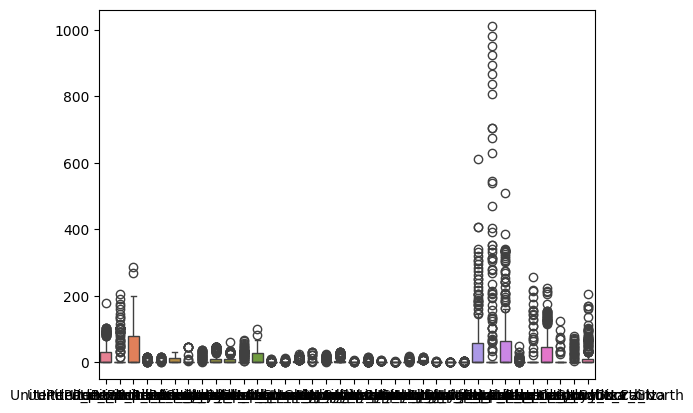

In [42]:
sns.boxplot(data=pivot_df_resampled_filtered)

* Again i preferd preserving data over removing all outliers .

### Stationarity check

* First we will check for stationarity using Augmented Dicky fuller test .

In [43]:
def test_stationarity(series):
    result = adfuller(series)
    print(f"p-value: {result[1]}")
    if result[1] < 0.05:
        print("Series is stationary")
    else:
        print("Series is not stationary")

# Test for stationarity on each column (assuming each column is a time series)
for column in pivot_df[out_cols]:
    print(f"Testing stationarity for {column}")
    test_stationarity(pivot_df_resampled_filtered[column])


Testing stationarity for quantity_product x _Cairo
p-value: 0.00019238432249128832
Series is stationary
Testing stationarity for quantity_product x _Giza
p-value: 0.006712926190793211
Series is stationary
Testing stationarity for quantity_product x _North
p-value: 0.004336818090477082
Series is stationary
Testing stationarity for quantity_product y_Cairo
p-value: 0.011281902254118193
Series is stationary
Testing stationarity for quantity_product y_Giza
p-value: 3.726164455076036e-07
Series is stationary
Testing stationarity for quantity_product y_North
p-value: 0.04574754316388056
Series is stationary
Testing stationarity for quantity_product z_Cairo
p-value: 2.9866632281437407e-07
Series is stationary
Testing stationarity for quantity_product z_Giza
p-value: 0.006146780615404603
Series is stationary
Testing stationarity for quantity_product z_North
p-value: 3.1515024351523574e-16
Series is stationary


* Data was found to be non-stationary thereby we will need further maniuplation .

### Seasonality , trend and residuals

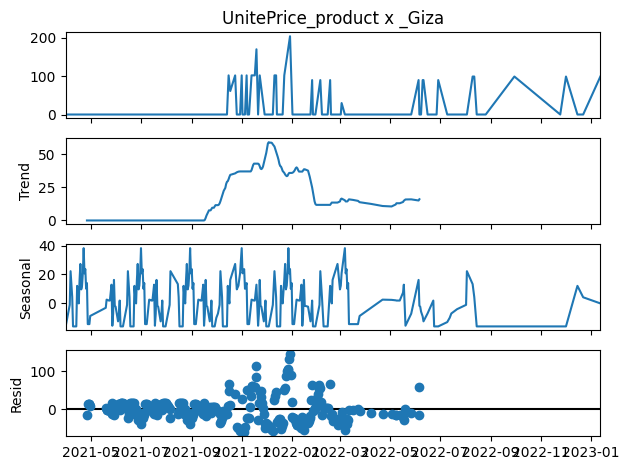

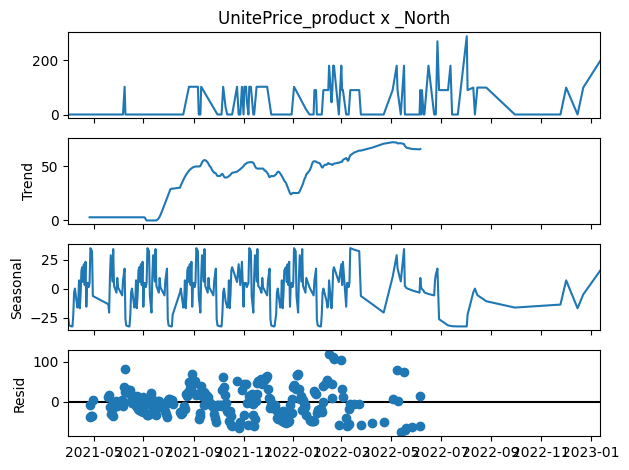

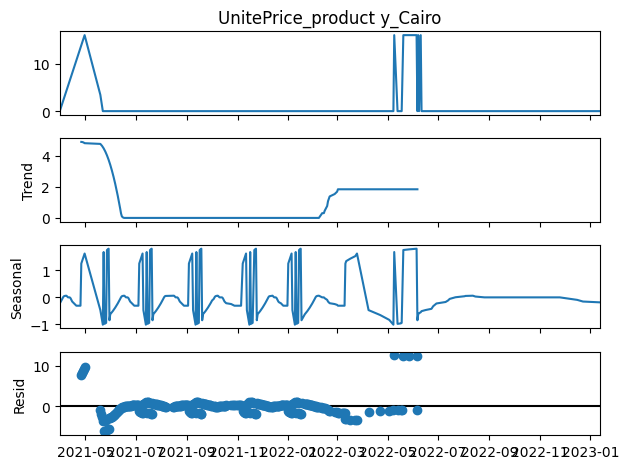

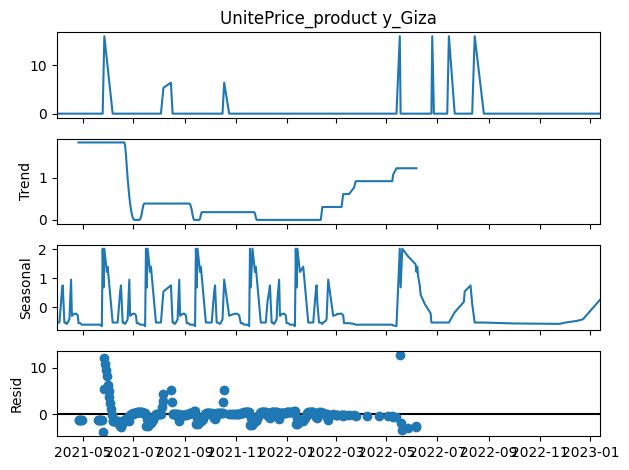

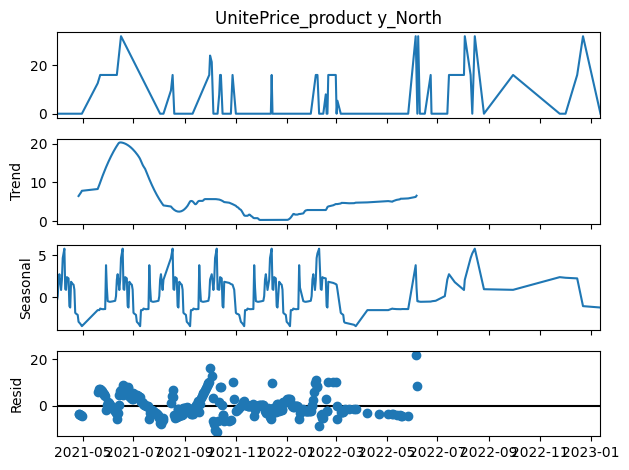

...

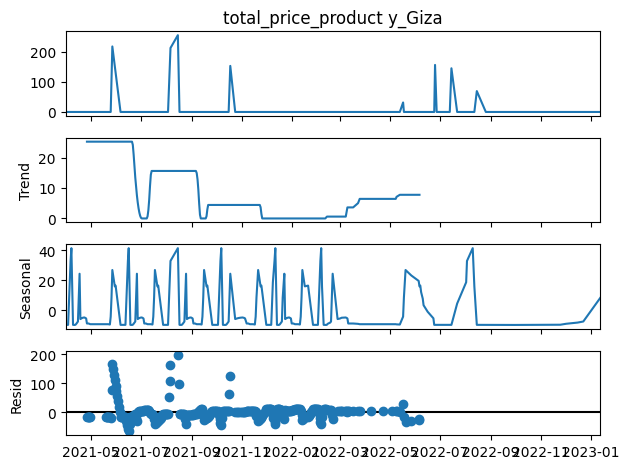

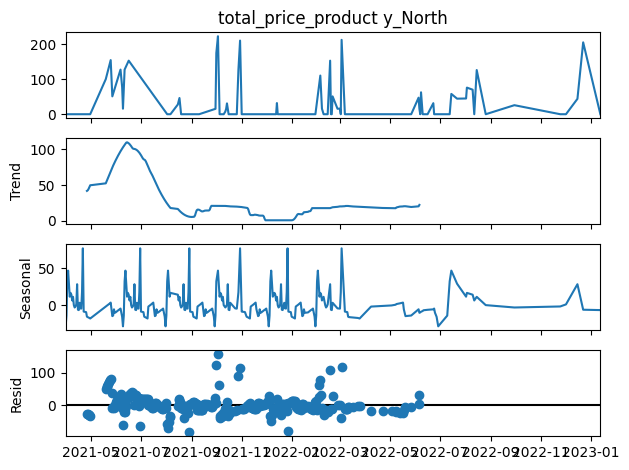

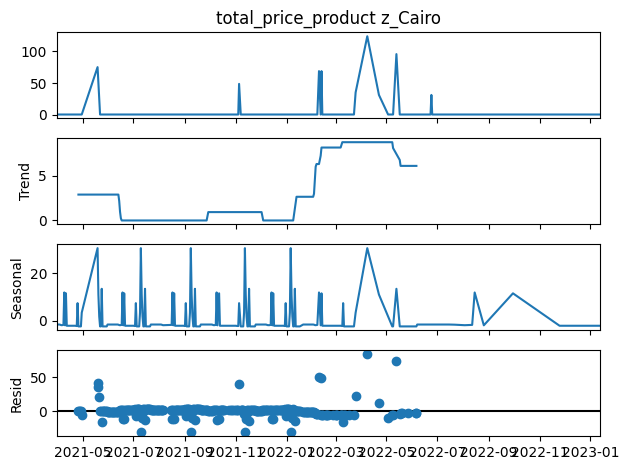

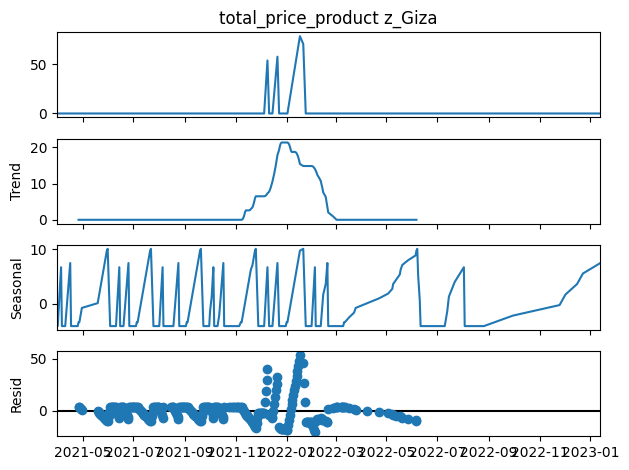

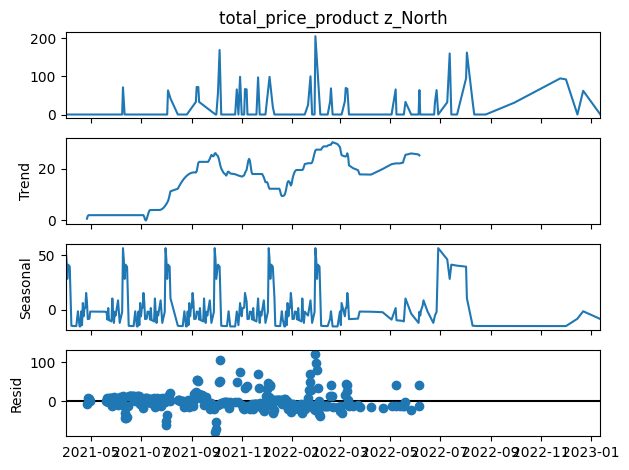

In [44]:
# I will use additive approch where yt= seasonal component + trend + residuals
def decompose_time_series(series):
  # i will check for weekly seasonal component period = 52 week
    decomposition = seasonal_decompose(series, model='additive', period=52)
  # used additive approch since Multiplicative seasonality is not appropriate for zero and negative values
    decomposition.plot()
    plt.show()

# Decompose output c to visualize seasonality
for i in range (1 , len(pivot_df_resampled_filtered.columns)) :
  decompose_time_series(pivot_df_resampled_filtered.iloc[:, i])


*  Although data has no obvious pattern but decomposition leads to seasonality
(seasonal fluctuations are constant over time) .
*  seasonal component’s amplitude looks consistent and does not grow/shrink with the trend, an additive decomposition seems to be the correct choice for this time series since multiplicative seasonality is not appropriate for zero and negative values.





### ACF & PACF

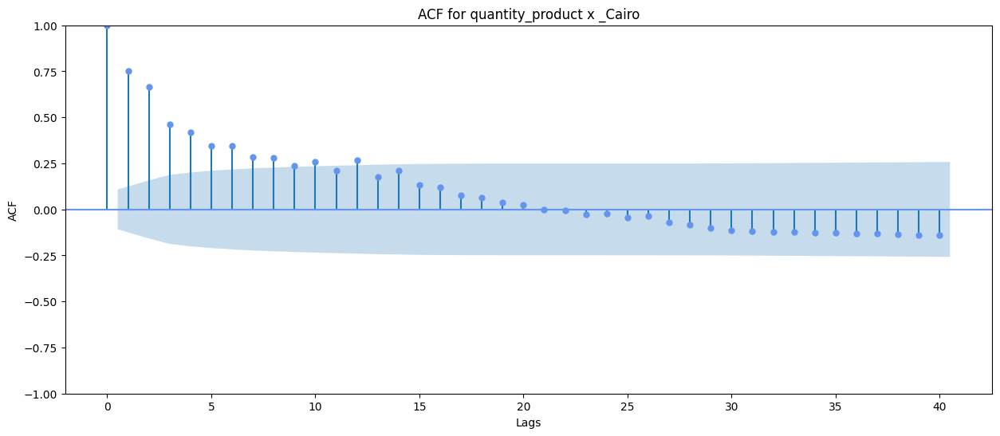

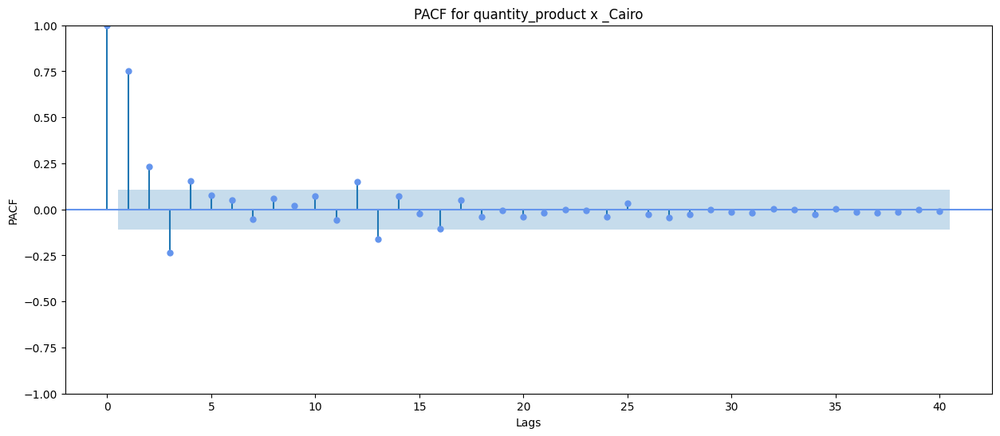

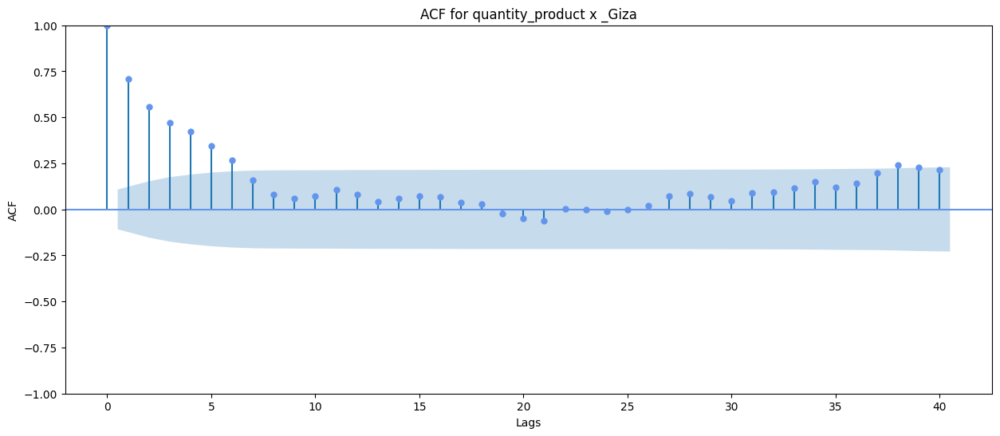

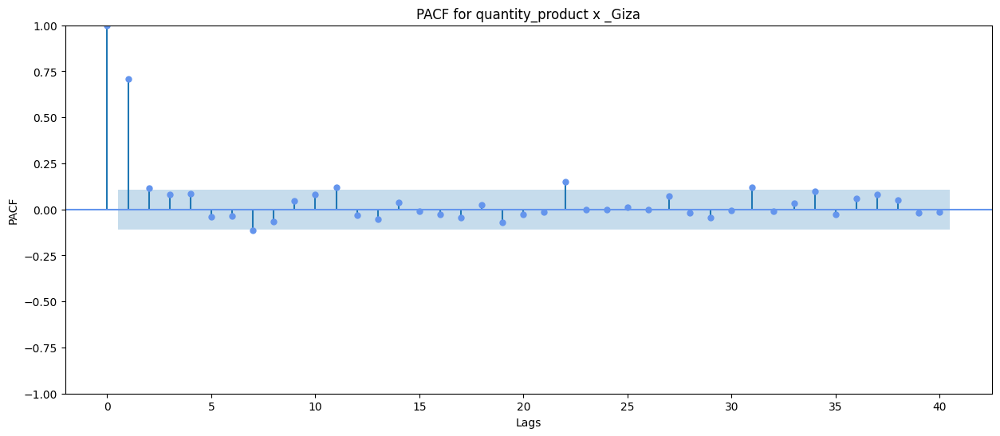

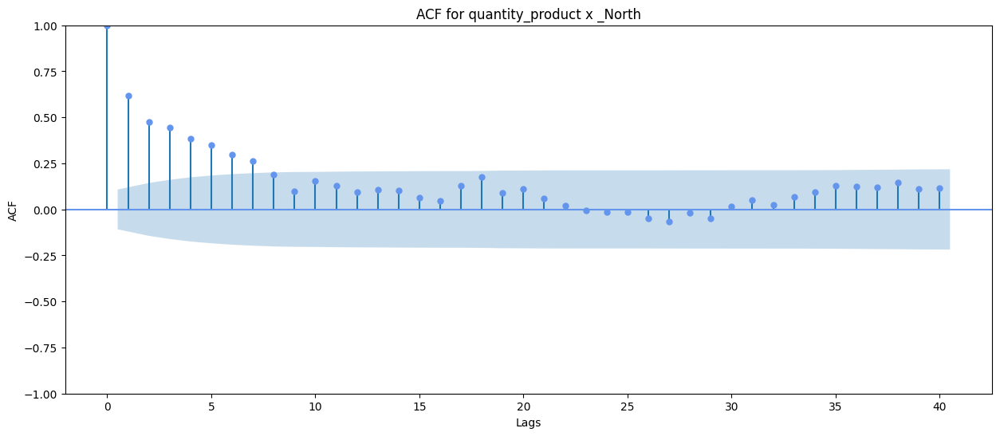

...

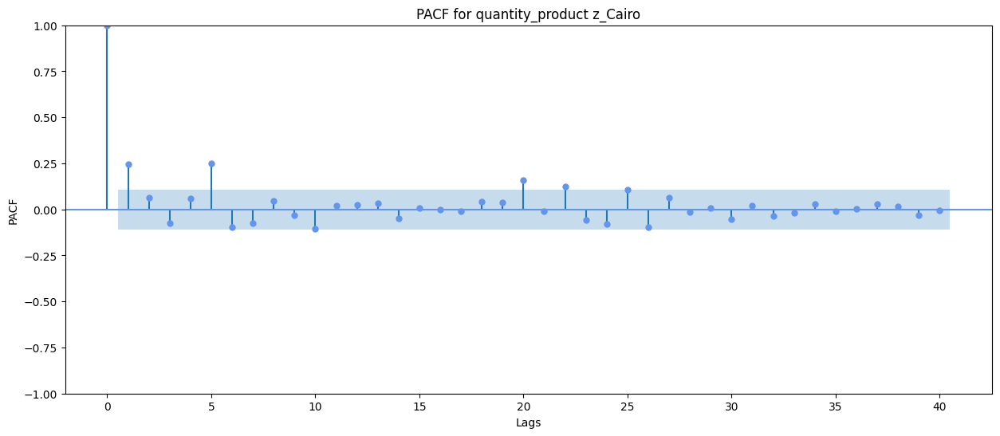

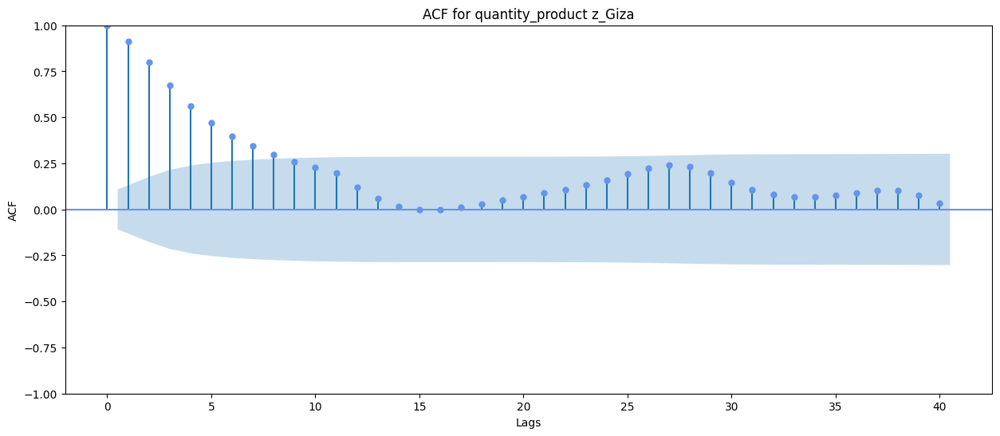

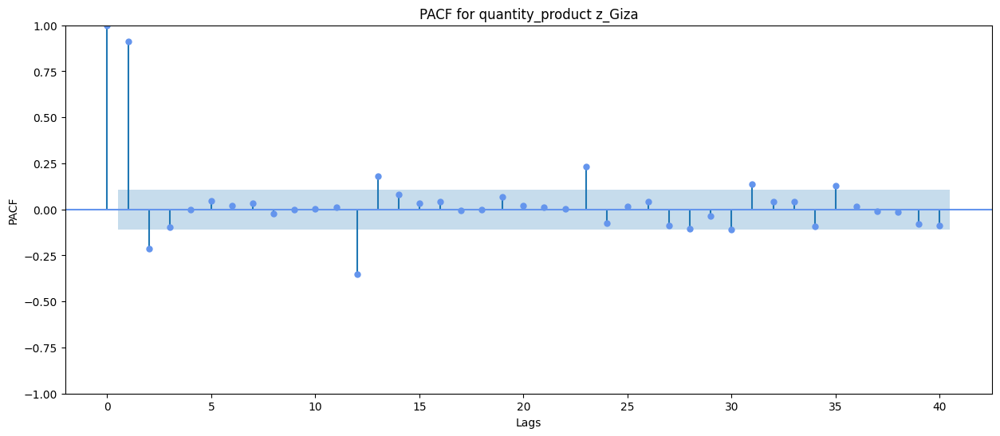

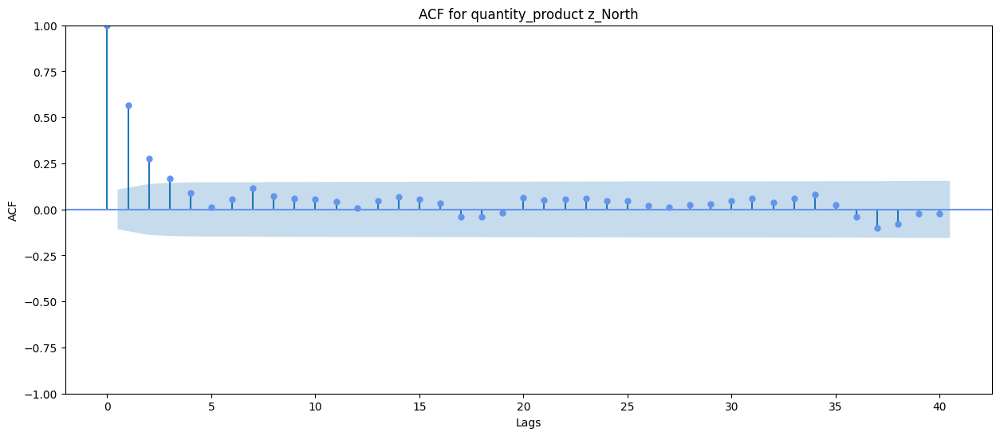

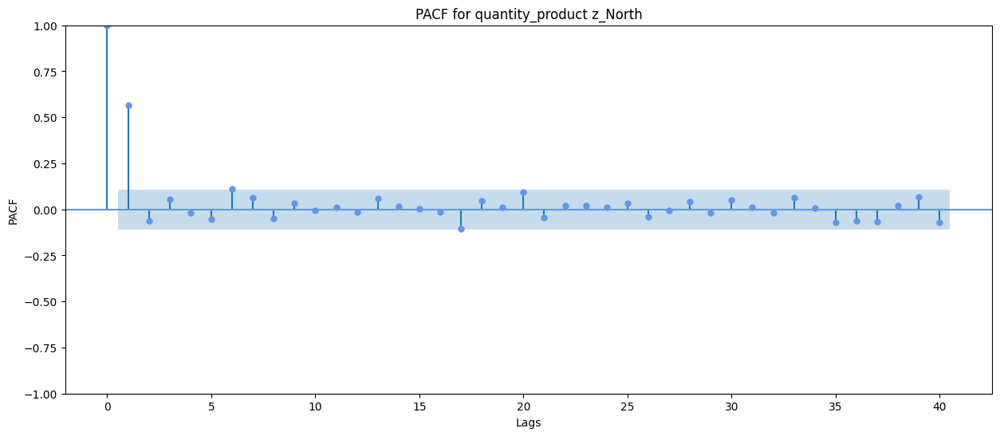

In [45]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
# Loop through your target columns and plot ACF and PACF
for col in out_cols:
    # Plot ACF
    plt.figure(figsize=(15, 6))
    plot_acf(pivot_df_resampled_filtered[col], lags=40, ax=plt.gca(), color='cornflowerblue')
    plt.title(f'ACF for {col}')
    plt.xlabel('Lags')
    plt.ylabel('ACF')
    plt.show()

    # Plot PACF
    plt.figure(figsize=(15, 6))
    plot_pacf(pivot_df_resampled_filtered[col], lags=40, ax=plt.gca(), color='cornflowerblue')
    plt.title(f'PACF for {col}')
    plt.xlabel('Lags')
    plt.ylabel('PACF')
    plt.show()


### Conclusion

* Series is non stationary and have seasonal component which would limit our choices .

# Model

## Traditional model ( LightGBM )

### Why


*   Since our series is multivariant and non stationary and has seasonal component .

*   we have alot of features (dimensions) .

*   28 input features (exogenous) + 9 output targets (endogenous) .

**so i decided to use LightGBM since CatBoost slower than LightGBM and more memory consuming (take me alot of time to do random search).**

NOTE : another alternative to use similar model like XGboost or statistical models like VARX .

### Data Preparation


In [ ]:
n_steps = 20           # used instances to make prediction
n_features_out=9       # output features
forecast_horizon = 10  # Predict 10 days ahead

In [ ]:
def split_sequences_multi_output(data, n_steps, forecast_horizon, n_features_out):
    X, y = [], []
    for i in range(len(data)):
        end_ix = i + n_steps
        out_end_ix = end_ix + forecast_horizon - 1
        if out_end_ix > len(data) - 1:
            break
        seq_x = data[i:end_ix, :-n_features_out]  # Exclude future output features (data leakage)
        seq_y = data[end_ix:out_end_ix + 1, -n_features_out:]  # Collect 10-day future outputs
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

In [ ]:
y = pivot_df_resampled_filtered[out_cols]
X = pivot_df_resampled_filtered.drop(out_cols, axis=1)

In [ ]:
pivot_df_diff = pivot_df_resampled_filtered.copy()
for feature in X.columns:
  pivot_df_diff[f'{feature}_rolling7'] = pivot_df_diff[feature].rolling(7).mean()

### Feature Engineering

In [ ]:
y = pivot_df_diff[out_cols]
X = pivot_df_diff.drop(out_cols, axis=1)

In [ ]:
scaler = RobustScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
from numpy import hstack
dataset = hstack((X_scaled,y)) # stack data horizontally
# convert into input/output
X, y = split_sequences_multi_output(dataset, n_steps, forecast_horizon, n_features_out)
n_features_in = X.shape[2]

In [ ]:
import datetime
# Define  reference date
reference_date = np.datetime64('2021-03-31')
# Convert datetime.date to number of days since the reference date
def convert_dates_to_days_since_reference(data):
    # Convert to NumPy datetime64 and subtract reference_date to get the timedelta
    return (np.datetime64(data) - reference_date).astype('timedelta64[D]').astype(int)

# Apply this conversion to the first column
for i in range(X.shape[0]):  # Iterate over each sample
    for j in range(X.shape[1]):  # Iterate over each time step
        if isinstance(X[i, j, 0], datetime.date):  # If the element is a date object
            X[i, j, 0] = convert_dates_to_days_since_reference(X[i, j, 0])

In [ ]:
X = X.astype('float32')
y = y.astype('float32')
X_test = X[-10:]
y_test = y[-10:]
X_remaining = X[:-10]
y_remaining = y[:-10]
val_size = int(0.1 * len(X_remaining))  # 10% of remaining data for validation
X_train = X_remaining[:-val_size]
y_train = y_remaining[:-val_size]
X_val = X_remaining[-val_size:]
y_val = y_remaining[-val_size:]

print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}, y_test shape: {y_test.shape}")


X_train shape: (261, 20, 54), y_train shape: (261, 10, 9)
X_test shape: (10, 20, 54), y_test shape: (10, 10, 9)


### Model Training with LightGBM


In [ ]:
from lightgbm import LGBMRegressor
from sklearn.multioutput import MultiOutputRegressor

# Initialize LightGBM model
lgbm = LGBMRegressor(objective='regression', reg_alpha=0.1,reg_lambda=0.2)

# Wrap for multi-output regression
model = MultiOutputRegressor(lgbm)

# Train
# model.fit(X_train, y_train)

### Hyperparameter Tuning (Randomized Search)

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

param_grid = {
    'estimator__n_estimators': [500,1000,1500,2000],
    'estimator__learning_rate': [0.01,0.05 ,0.1],
    'estimator__max_depth': [12,15,20],
    'estimator__subsample': [0.6, 0.8,1]

}

search = RandomizedSearchCV(
    model,
    param_distributions=param_grid,
    n_iter=15,
    cv=3,
    scoring='neg_mean_squared_error',
    n_jobs=-1,
    verbose=2
)
X_train_Lgbm=X_train.reshape(X_train.shape[0], -1)
y_train_Lgbm=y_train.reshape(y_train.shape[0], -1)
search.fit(X_train_Lgbm, y_train_Lgbm)
best_model = search.best_estimator_

Fitting 3 folds for each of 15 candidates, totalling 45 fits
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 22079
[LightGBM] [Info] Number of data points in the train set: 261, number of used features: 951
[LightGBM] [Info] Start training from score 0.415070
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

In [ ]:
print("Best Model:", best_model)

Best Model: MultiOutputRegressor(estimator=LGBMRegressor(learning_rate=0.01, max_depth=20,
                                             n_estimators=500,
                                             objective='regression',
                                             reg_alpha=0.1, reg_lambda=0.2,
                                             subsample=0.6))


### Evaluation

Combined shape: (10, 10, 18)
Root Mean Squared Error: 2.2563490667693933
Mean Absolute Error: 1.1466666666666667

Visualizing results for Day 1 of 10


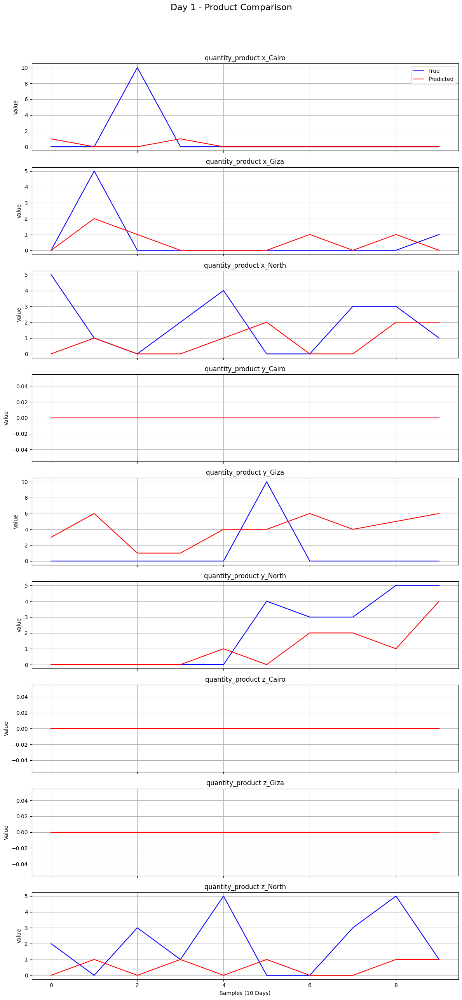


Visualizing results for Day 2 of 10


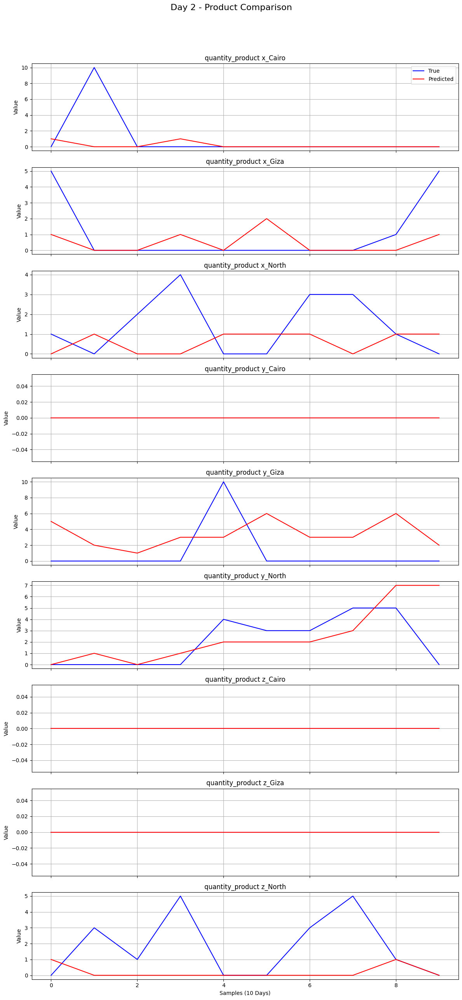


Visualizing results for Day 3 of 10


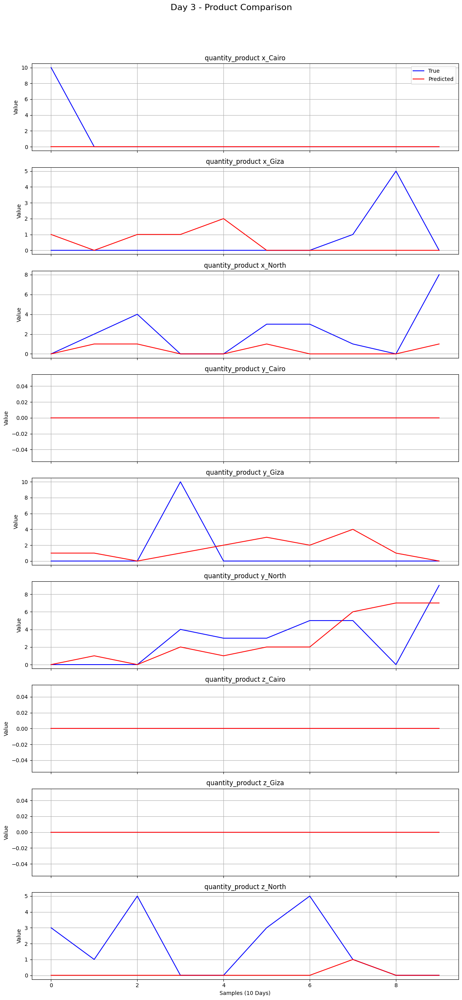


Visualizing results for Day 4 of 10


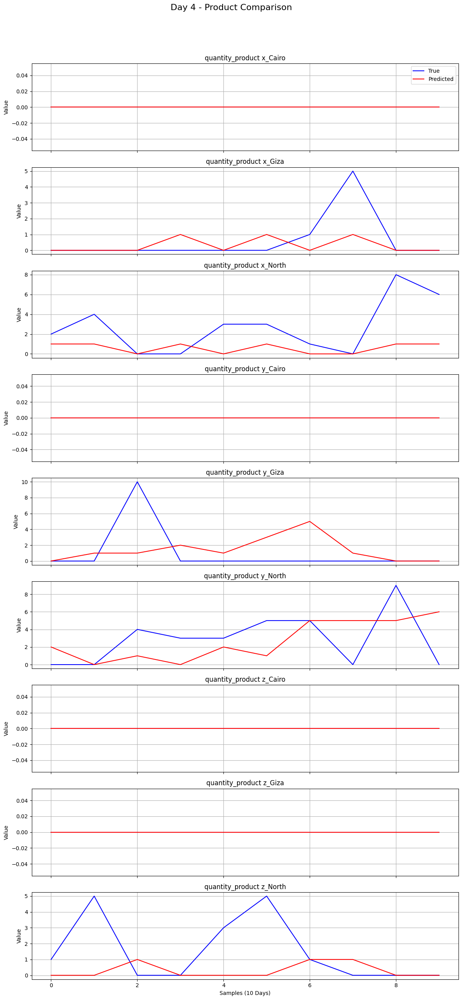


Visualizing results for Day 5 of 10


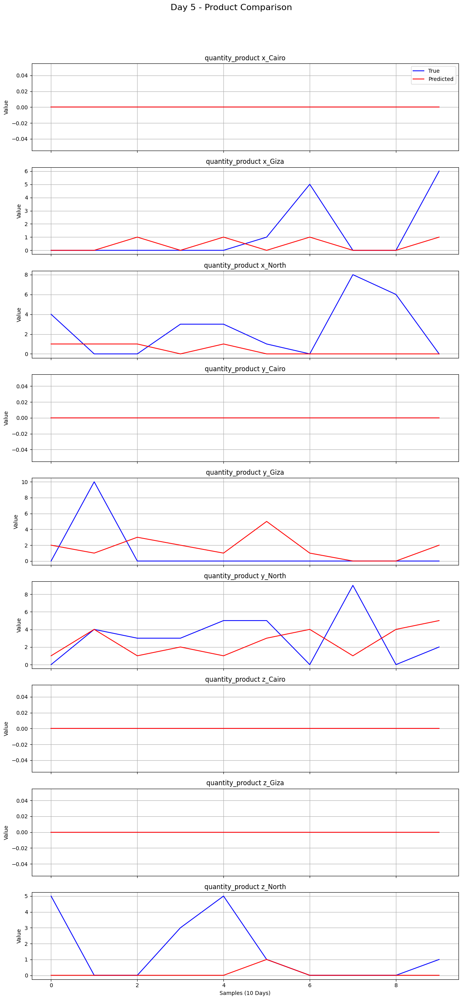


Visualizing results for Day 6 of 10


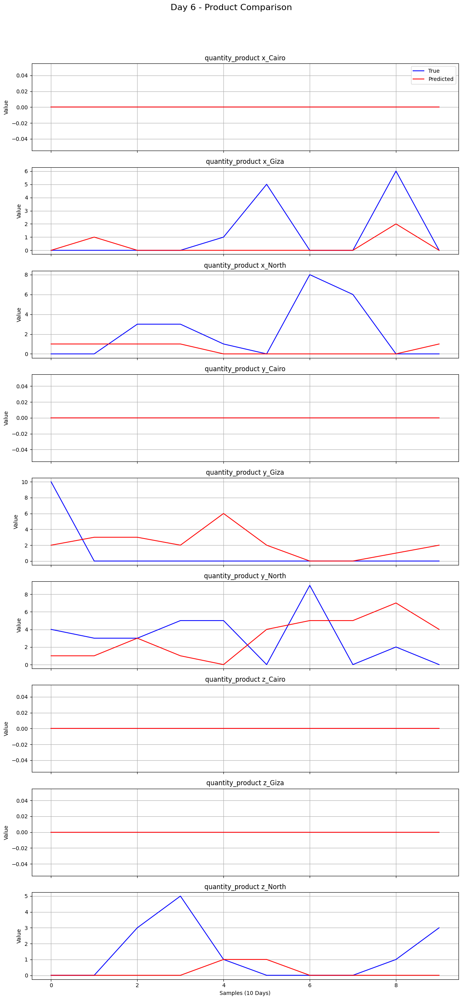


Visualizing results for Day 7 of 10


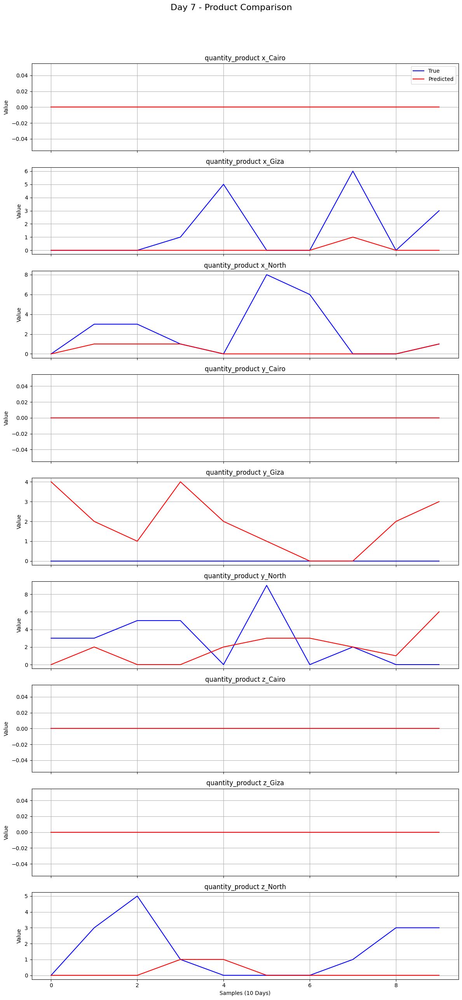


Visualizing results for Day 8 of 10


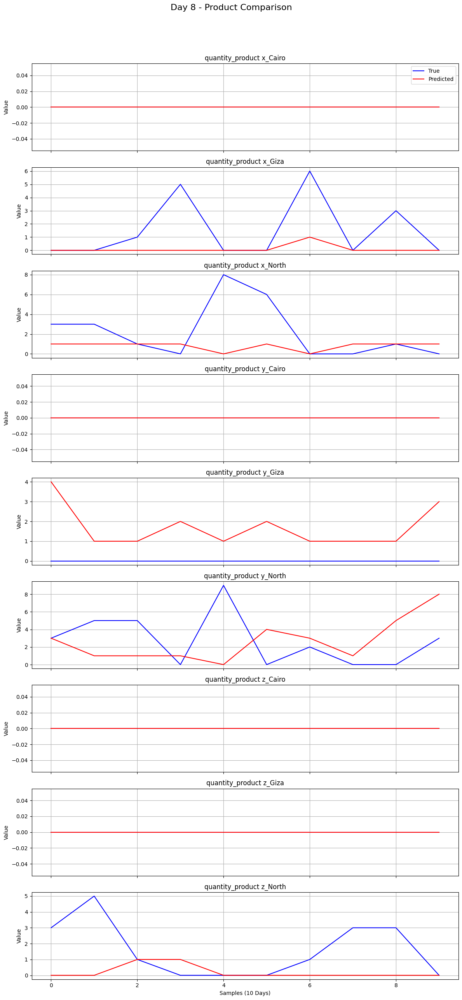


Visualizing results for Day 9 of 10


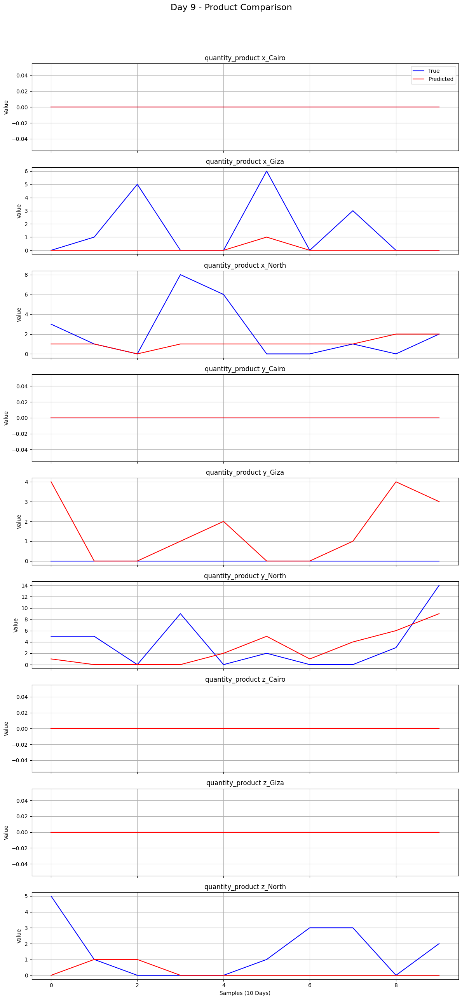


Visualizing results for Day 10 of 10


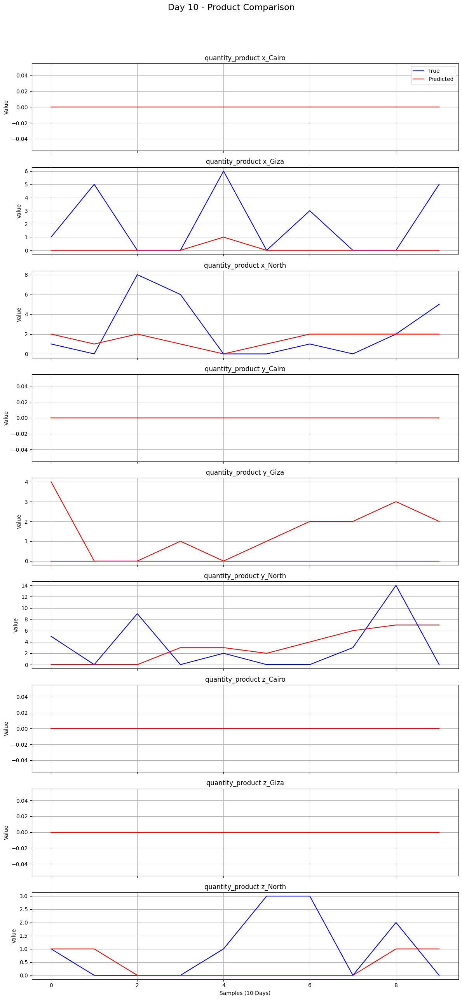

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
forecast_horizon=10
n_features_out=9
X_test_reshaped = X_test.reshape(X_test.shape[0], -1)  # Shape: (num_samples, forecast_horizon * num_features)
y_pred = best_model.predict(X_test_reshaped)
y_pred_clipped = np.clip(y_pred, 0, np.inf)
y_pred_clipped=y_pred_clipped.astype('int')
y_pred=y_pred_clipped.reshape(y_pred_clipped.shape[0], forecast_horizon, n_features_out)
product_names = [
    'quantity_product x_Cairo',
    'quantity_product x_Giza',
    'quantity_product x_North',
    'quantity_product y_Cairo',
    'quantity_product y_Giza',
    'quantity_product y_North',
    'quantity_product z_Cairo',
    'quantity_product z_Giza',
    'quantity_product z_North'
]

# 1. Combine y_test and y_pred for comparison (along the feature axis)
combined = np.concatenate([y_test, y_pred], axis=-1)
print(f"Combined shape: {combined.shape}")

# 2. Compute Root Mean Squared Error (RMSE) for all samples, timesteps, and products
mse = mean_squared_error(
    y_test.reshape(-1, y_test.shape[-1]),
    y_pred.reshape(-1, y_pred.shape[-1]),
    multioutput='uniform_average'
)
print(f"Root Mean Squared Error: {mse**0.5}")

# 3. Compute Mean Absolute Error (MAE) for all samples, timesteps, and products
mae = mean_absolute_error(
    y_test.reshape(-1, y_test.shape[-1]),
    y_pred.reshape(-1, y_pred.shape[-1]),
    multioutput='uniform_average'
)
print(f"Mean Absolute Error: {mae}")

# 4. Visualize comparison by day (all products per day)
samples = y_test.shape[0]  # Number of days
timesteps = 10
products = 9

for day in range(timesteps):  # Loop through all days
    print(f"\nVisualizing results for Day {day + 1} of {timesteps}")

    # Create a subplot for all products for the current day
    fig, axes = plt.subplots(nrows=products, ncols=1, figsize=(12, products * 3), sharex=True)
    fig.suptitle(f"Day {day + 1} - Product Comparison", fontsize=16)

    for product_idx, ax in enumerate(axes):  # Loop through all products
        # Plot True values
        ax.plot(range(samples), y_test[:, day, product_idx], label='True', color='blue')

        # Plot Predicted values
        ax.plot(range(samples), y_pred[:, day, product_idx], label='Predicted', color='red')

        # Title and Labels
        ax.set_title(f"{product_names[product_idx]}")
        ax.set_ylabel("Value")
        ax.grid()

    # Common labels
    axes[-1].set_xlabel("Samples (10 Days)")
    axes[0].legend(loc='upper right')

    # Adjust layout and show
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust for title space
    plt.show()

In [ ]:
# Check performance on non-zero sales days
#MAE
non_zero_mask = y_test != 0
non_zero_mae = np.mean(np.abs(y_test[non_zero_mask] - y_pred[non_zero_mask]))
print(f"Non-Zero MAE: {non_zero_mae:.2f}")
#RMSE
non_zero_rmse = np.sqrt(np.mean((y_test[non_zero_mask] - y_pred[non_zero_mask]) ** 2))
print(f"Non-Zero RMSE: {non_zero_rmse:.2f}")

In [ ]:
# Get feature importances for the first target
importance = best_model.estimators_[0].feature_importances_
X_train=X
feature_names =pivot_df_diff.drop(out_cols, axis=1).columns

plt.figure(figsize=(12, 150))
plt.barh(range(len(importance)), importance, align='center')
plt.yticks(range(len(importance)), feature_names)
plt.xlabel('Feature Importance')
plt.title('LightGBM Feature Importance')
plt.show()

* Added (total_price) feature has significant impact on model .

### Interpretation

* MAE about 2 in averge which means predictions is off by 2 units and RMSE about 6 in average (Larger errors occur,
 likely from missing sales spikes) so RMSE > MAE means Model predicts zeros well (overpredicts)but struggles with sales spikes.
*  Trade off between RMSE and MAE (Bussines dependent) .


### Concolusion

* We need alot of hand crafted feature engineering .

## Deep learning model ( LSTM )

 -----------------------------------------------------------------------------------------------------------------------------

In [46]:
from numpy import hstack
import tensorflow as tf
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout, BatchNormalization, Flatten , Input,Masking ,TimeDistributed,RepeatVector  ,TimeDistributed,AdditiveAttention
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import train_test_split

### Data Preparation


In [47]:
n_steps = 20           # used instances to make prediction
n_features_out=9       # output features
forecast_horizon = 10  # Predict 10 days ahead

In [48]:
def split_sequences_multi_output(data, n_steps, forecast_horizon, n_features_out):
    X, y = [], []
    for i in range(len(data)):
        end_ix = i + n_steps
        out_end_ix = end_ix + forecast_horizon - 1
        if out_end_ix > len(data) - 1:
            break
        seq_x = data[i:end_ix, :-n_features_out]  # Exclude future output features (data leakage)
        seq_y = data[end_ix:out_end_ix + 1, -n_features_out:]  # Collect 10-day future outputs
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

In [49]:
y = pivot_df_resampled_filtered[out_cols]
X = pivot_df_resampled_filtered.drop(out_cols, axis=1)

In [51]:
dataset = hstack((X,y)) # stack data horizontally
# convert into input/output
X, y = split_sequences_multi_output(dataset, n_steps, forecast_horizon, n_features_out)
n_features_in = X.shape[2]

In [52]:
import datetime
# Define  reference date
reference_date = np.datetime64('2021-03-31')
# Convert datetime.date to number of days since the reference date
def convert_dates_to_days_since_reference(data):
    # Convert to NumPy datetime64 and subtract reference_date to get the timedelta
    return (np.datetime64(data) - reference_date).astype('timedelta64[D]').astype(int)

# Apply this conversion to the first column
for i in range(X.shape[0]):  # Iterate over each sample
    for j in range(X.shape[1]):  # Iterate over each time step
        if isinstance(X[i, j, 0], datetime.date):  # If the element is a date object
            X[i, j, 0] = convert_dates_to_days_since_reference(X[i, j, 0])

In [53]:
# Total data
n = len(X)

# Test set: Last 10 samples
X_test = X[-10:]
y_test = y[-10:]

# Remaining data (N-10 samples)
X_remaining = X[:-10]
y_remaining = y[:-10]

# Validation set: Last 10% of remaining data
val_size = int(0.1 * len(X_remaining))  # Adjust to your needs
X_train = X_remaining[:-val_size]
y_train = y_remaining[:-val_size]
X_val = X_remaining[-val_size:]
y_val = y_remaining[-val_size:]

# Check shapes
print(f"Train: {X_train.shape}, {y_train.shape}")
print(f"Val: {X_val.shape}, {y_val.shape}")
print(f"Test: {X_test.shape}, {y_test.shape}")

Train: (261, 20, 27), (261, 10, 9)
Val: (29, 20, 27), (29, 10, 9)
Test: (10, 20, 27), (10, 10, 9)


In [59]:
scaler = RobustScaler()
X_train=X_train.reshape(X_train.shape[0], -1)
X_scaled = scaler.fit_transform(X_train)
X_train=X_train.reshape(X_train.shape[0], n_steps, n_features_in)
X_val=X_val.reshape(X_val.shape[0], -1)
X_test=X_test.reshape(X_test.shape[0], -1)
X_scaled = scaler.transform(X_val)
X_scaled = scaler.transform(X_test)
X_val=X_val.reshape(X_val.shape[0], n_steps, n_features_in)
X_test=X_test.reshape(X_test.shape[0], n_steps, n_features_in)

In [60]:
print("X shape:", X.shape)  # Expected: (num_samples, n_steps, n_features)
print("y shape:", y.shape)  # Expected: (num_samples, 10)


X shape: (300, 20, 27)
y shape: (300, 10, 9)


### Oversampling

In [61]:
high_sales_mask = (y_train >= 1).any(axis=(1, 2))

X_high = X_train[high_sales_mask]
y_high = y_train[high_sales_mask]

# Combine with original data
X_combined = np.vstack([X_train, X_high])
y_combined = np.vstack([y_train, y_high])

* Oversampling high values to add balance to data (Reduce RMSE) .

In [62]:
print("Shape of X_train:", X_train.shape)
print("Shape of y_train:", y_train.shape)

print("Final X_combined shape:", X_combined.shape)
print("Final y_combined shape:", y_combined.shape)
y_combined = y_combined.reshape(y_combined.shape[0], -1)

Shape of X_train: (261, 20, 27)
Shape of y_train: (261, 10, 9)
Final X_combined shape: (512, 20, 27)
Final y_combined shape: (512, 10, 9)


* Oversample high sales periods to reduce class imbalance .

##### Custom loss function

In [63]:
from tensorflow.keras.models import load_model
from tensorflow.keras.saving import register_keras_serializable
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint,LearningRateScheduler

@register_keras_serializable()

def weighted_rmse(y_true, y_pred,  base_weight_zero=1.0,  base_weight_non_zero=25.0, high_sales_factor=5.0, high_sales_threshold=8.0, normalize_weights=True):
    base_weights = tf.where(y_true == 0, base_weight_zero, base_weight_non_zero)
    high_sales_mask = tf.cast(y_true >= high_sales_threshold, tf.float32)
    high_sales_weights = high_sales_factor * high_sales_mask
    weights = base_weights + high_sales_weights

    if normalize_weights:
        weights = weights / tf.reduce_mean(weights)

    squared_errors = weights * tf.square(y_true - y_pred)
    rmse = tf.sqrt(tf.reduce_mean(squared_errors))
    return rmse

Resulting Weights:

* 1.0 for y_true == 0.

* 3.0 for 0 < y_true < 5.

* 8.0 for y_true >= 5.

**Penalize predictions of high sales is scale .**

### One shot LSTM

####LSTM Model Architecture


In [64]:
from tensorflow.keras.layers import GRU
input_shape = (n_steps, n_features_in)
model = Sequential()
model.add(Input(shape=input_shape))
model.add(Masking(mask_value=0.0))
model.add(GRU(70, return_sequences=False))
model.add(Dropout(0.5))
model.add(Dense(40))
model.add(Dropout(0.5))
model.add(BatchNormalization())
model.add(Dense(n_features_out * forecast_horizon, activation='linear'))  # Linear activation for regression
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ masking (Masking)                    │ (None, 20, 27)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru (GRU)                            │ (None, 70)                  │          20,790 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 70)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 40)                  │           2,840 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 40)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 40)                  │             160 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 90)                  │           3,690 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 27,480 (107.34 KB)

 Trainable params: 27,400 (107.03 KB)

 Non-trainable params: 80 (320.00 B)

* Masking layer to pay more attention to non-zero values .
* Adding dropout layer to prevent overfitting .
* Replace faltten layer with LSTM to preserve temporal structure .
* Adding batchnorm layer helps stabilize training and improve convergence .
* Adding relu activiation in last layer to cut off negative predictions .

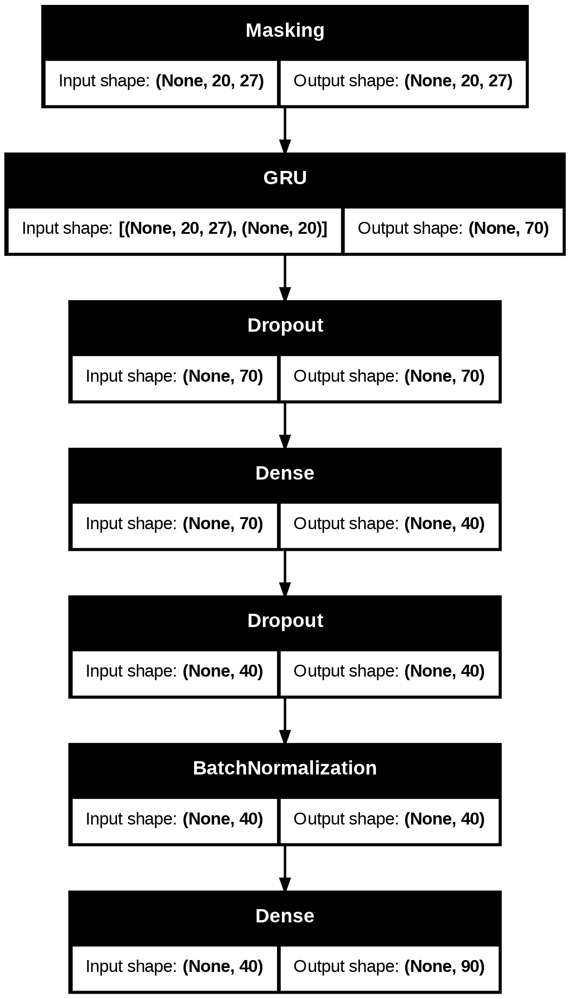

In [65]:
plot_model(model, show_shapes=True)

##### Model training

In [66]:
# Define the optimizer with a custom exponentially decaying learning rate
def lr_schedule(epoch, lr):
    if epoch > 10:  # Start decaying after 10 epochs
        lr = lr * 0.99999
    return lr
lr_scheduler = LearningRateScheduler(lr_schedule)
optimizer = Adam(learning_rate=0.0001)

model.compile(optimizer=optimizer, loss=weighted_rmse)

* Small learning rate with decaying to apply smoothness .

In [67]:
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)
model_checkpoint = ModelCheckpoint(
    filepath='/content/drive/MyDrive/NLP/best_model.keras',
    monitor='val_loss',
    save_best_only=True,
    verbose=1
)

* Adding early stoping to prevent overfitting and callback to save best model .


In [68]:
# Train the model
history = model.fit(X_combined, y_combined,
                    epochs=500,
                    verbose=1,
                    callbacks=[ model_checkpoint,early_stopping,lr_scheduler],
                    validation_data=(X_val, y_val.reshape(y_val.shape[0], -1)))


Epoch 1/500
13/16 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 4.7245
Epoch 1: val_loss improved from inf to 3.30342, saving model to /content/drive/MyDrive/NLP/best_model.keras
16/16 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 4.7031 - val_loss: 3.3034 - learning_rate: 1.0000e-04
Epoch 2/500
14/16 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 4.4829
Epoch 2: val_loss improved from 3.30342 to 3.29034, saving model to /content/drive/MyDrive/NLP/best_model.keras
16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 4.5064 - val_loss: 3.2903 - learning_rate: 1.0000e-04
Epoch 3/500
13/16 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 4.7351
Epoch 3: val_loss improved from 3.29034 to 3.28323, saving model to /content/drive/MyDrive/NLP/best_model.keras
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 4.7149 - val_loss: 3.2832 - learning_rate: 1.0000e-04
Epoch 4/500
13/16 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 4.4690
Epoch 4: val_loss improved from 3.28323 to 3.27835, saving model to /content/drive/MyDrive/NL

* First approch , I use only encoder LSTM to predict all 10 days in one shot without feedback from prediction of previous day .
* In this case many to many un aligned .

### Seq2seq LSTM

#### Seq2seq model architecture

In [101]:
# Encoder Processes the input sequence and encodes it into a context vector.
encoder_inputs = Input(shape=(n_steps, n_features_in))
masking=(Masking(mask_value=0.0))(encoder_inputs)
lstm1 = (LSTM(200,return_sequences=True))(masking)
encoder1=Dropout(0.7)(lstm1)
lstm2 = LSTM(150)(masking)
encoder2=Dropout(0.7)(lstm2)
encoder=(BatchNormalization())(encoder2)



# Decoder generates the output sequence step-by-step using the context vector.

# Repeats the context vector for each time step in the output sequence
decoder_inputs = RepeatVector(forecast_horizon)(encoder)
decoder = LSTM(100,return_sequences=True)(decoder_inputs)
# TimeDistributed	Applies a dense layer to each time step independently
outputs = TimeDistributed(Dense(n_features_out,activation="linear"))(decoder)

model_seq = Model(encoder_inputs, outputs)

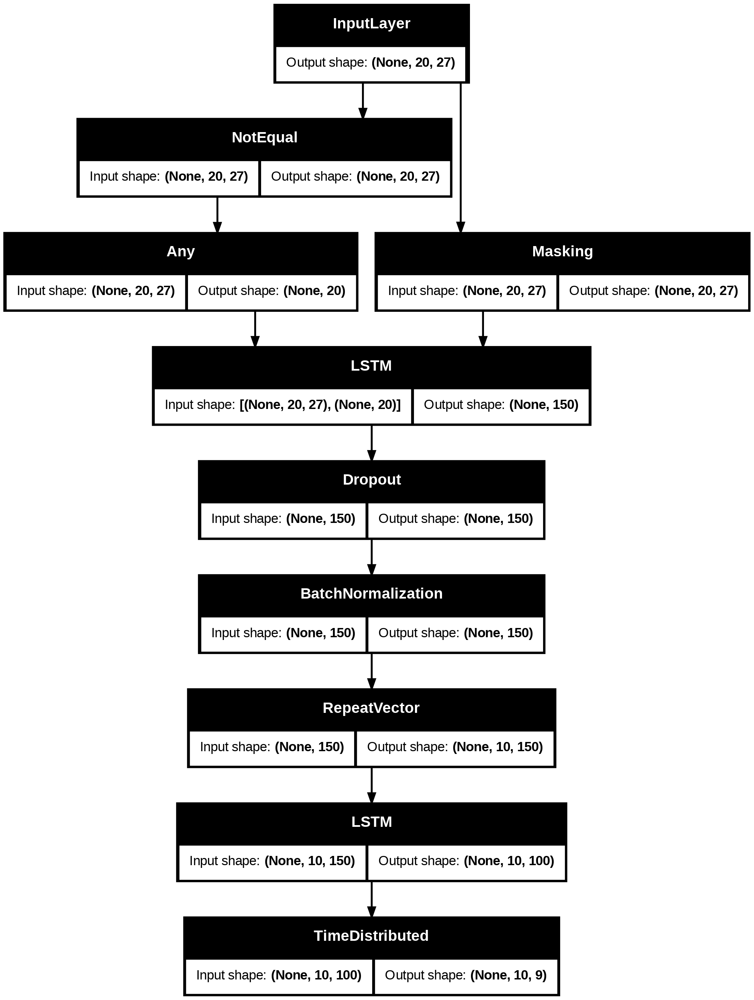

In [75]:
plot_model(model_seq, show_shapes=True)

##### Model training

In [103]:
# Define the optimizer with a custom exponentially decaying learning rate
def lr_schedule(epoch, lr):
    if epoch > 10:  # Start decaying after 10 epochs
        lr = lr * 0.95
    return lr
lr_scheduler = LearningRateScheduler(lr_schedule)
optimizer = Adam(learning_rate=0.0001)

model_seq.compile(optimizer=optimizer, loss=weighted_rmse)

In [104]:
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
model_checkpoint = ModelCheckpoint(
    filepath='/content/drive/MyDrive/NLP/best_model_seq.keras',
    monitor='val_loss',
    save_best_only=True,
    verbose=1
)

In [105]:
# Train the model
y_combined = y_combined.reshape(-1, forecast_horizon, n_features_out)
history2 = model_seq.fit(X_combined, y_combined,
                    epochs=700,
                    verbose=1,
                    callbacks=[ model_checkpoint,early_stopping,lr_scheduler],
                    validation_data=(X_val, y_val))

Epoch 1/700
15/16 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 4.5819
Epoch 1: val_loss improved from inf to 3.24257, saving model to /content/drive/MyDrive/NLP/best_model_seq.keras
16/16 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 4.5836 - val_loss: 3.2426 - learning_rate: 1.0000e-04
Epoch 2/700
15/16 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 4.4087
Epoch 2: val_loss improved from 3.24257 to 3.24001, saving model to /content/drive/MyDrive/NLP/best_model_seq.keras
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 4.4254 - val_loss: 3.2400 - learning_rate: 1.0000e-04
Epoch 3/700
15/16 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 4.5041
Epoch 3: val_loss improved from 3.24001 to 3.23524, saving model to /content/drive/MyDrive/NLP/best_model_seq.keras
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 4.5028 - val_loss: 3.2352 - learning_rate: 1.0000e-04
Epoch 4/700
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 4.5512
Epoch 4: val_loss improved from 3.23524 to 3.22771, saving model to /content/drive

### Visualization

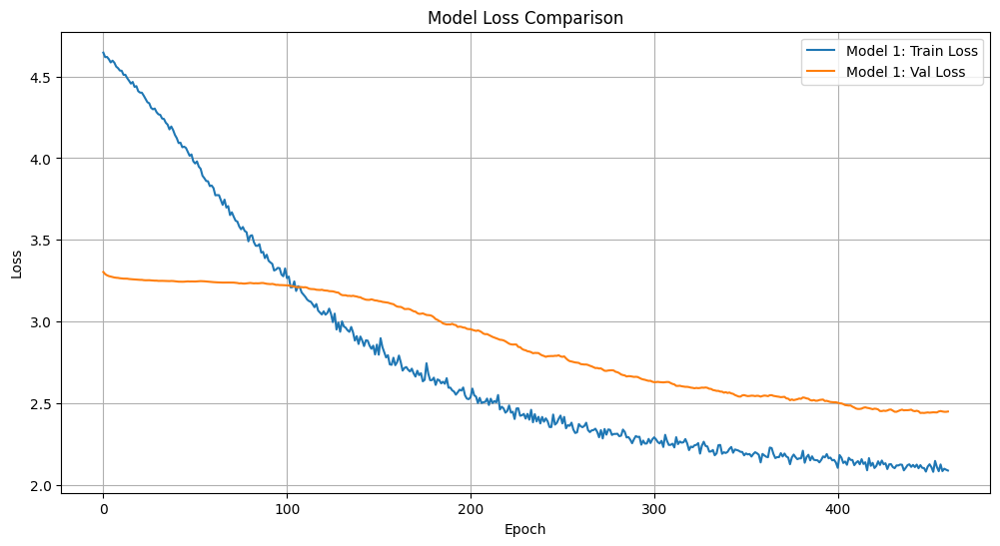

In [69]:
plt.figure(figsize=(12, 6))

# Model 1
plt.plot(history.history['loss'], label='Model 1: Train Loss', linestyle='-')
plt.plot(history.history['val_loss'], label='Model 1: Val Loss', linestyle='-')

plt.title('Model Loss Comparison')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

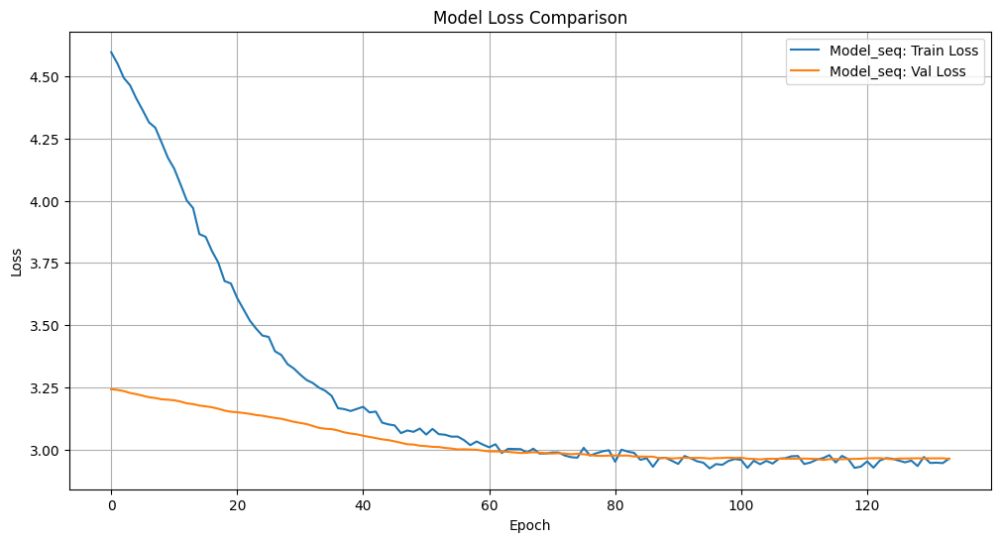

In [106]:
# Model 2
plt.figure(figsize=(12, 6))
plt.plot(history2.history['loss'], label='Model_seq: Train Loss', linestyle='-')
plt.plot(history2.history['val_loss'], label='Model_seq: Val Loss', linestyle='-')

plt.title('Model Loss Comparison')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

* Both models have approximate performance .

### Evaluation

In [116]:
from tensorflow.keras.models import load_model
# Load best model
best_model = load_model('/content/drive/MyDrive/NLP/best_model_seq.keras',
                          custom_objects={'weighted_mae': weighted_rmse} )

In [117]:
y_pred = best_model.predict(X_test, verbose=0)  # Predict future sequences
y_pred = y_pred.reshape(y_pred.shape[0], forecast_horizon, n_features_out)
y_pred = y_pred.astype('int')
y_test = y_test.astype('int')
y_pred = np.maximum(y_pred, 0)

Combined shape: (10, 10, 18)
Root Mean Squared Error: 1.9387854158954487
Mean Absolute Error: 1.1277777777777778

Visualizing results for Day 1 of 10


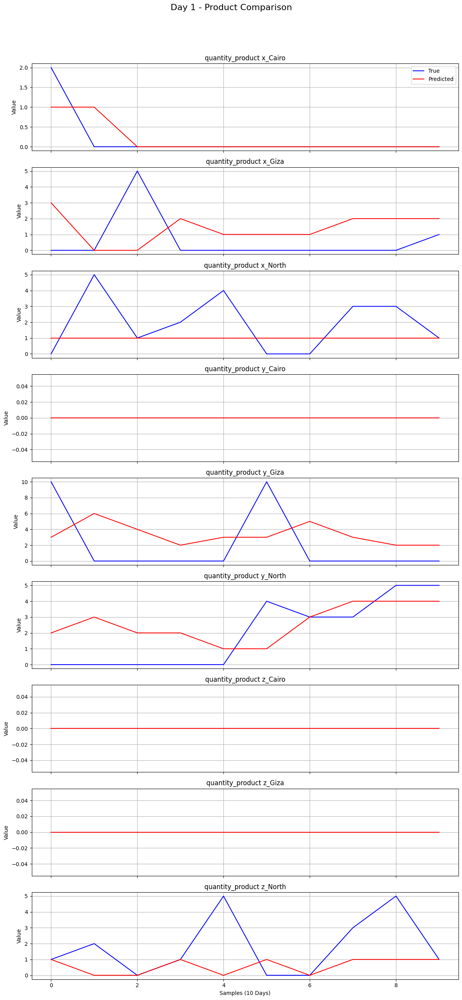


Visualizing results for Day 2 of 10


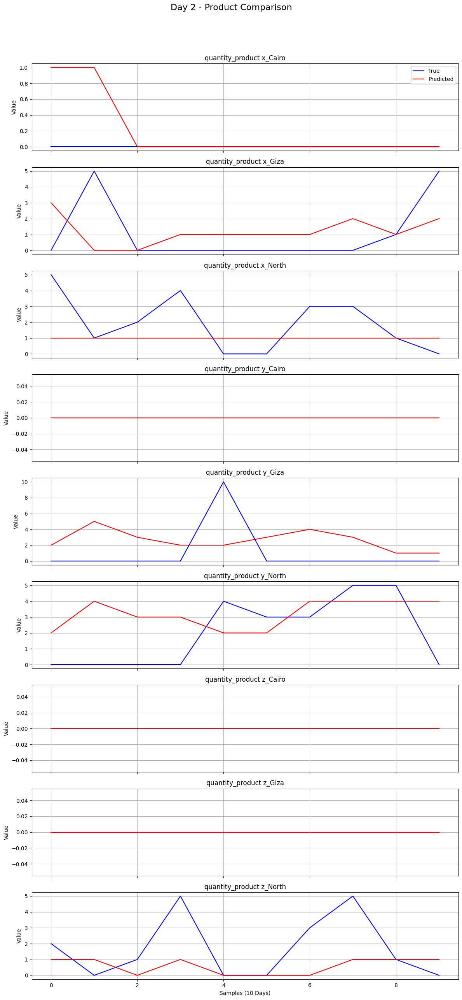


Visualizing results for Day 3 of 10


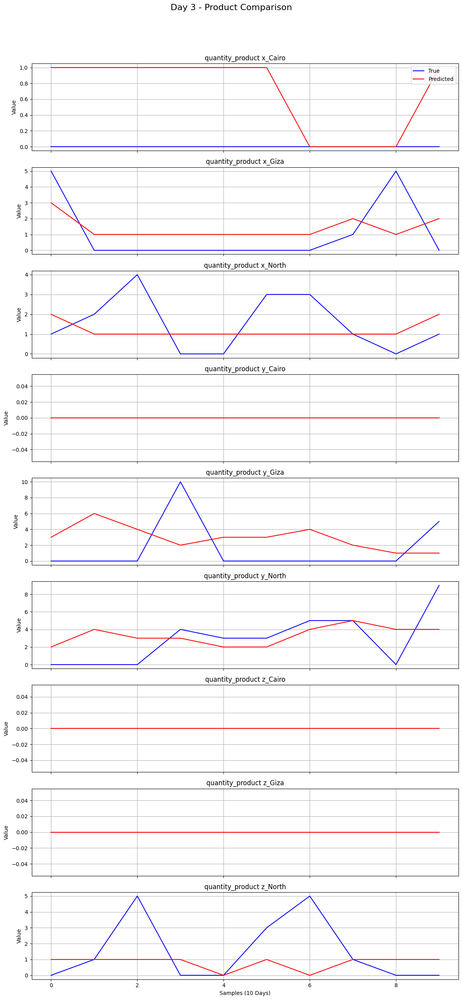


Visualizing results for Day 4 of 10


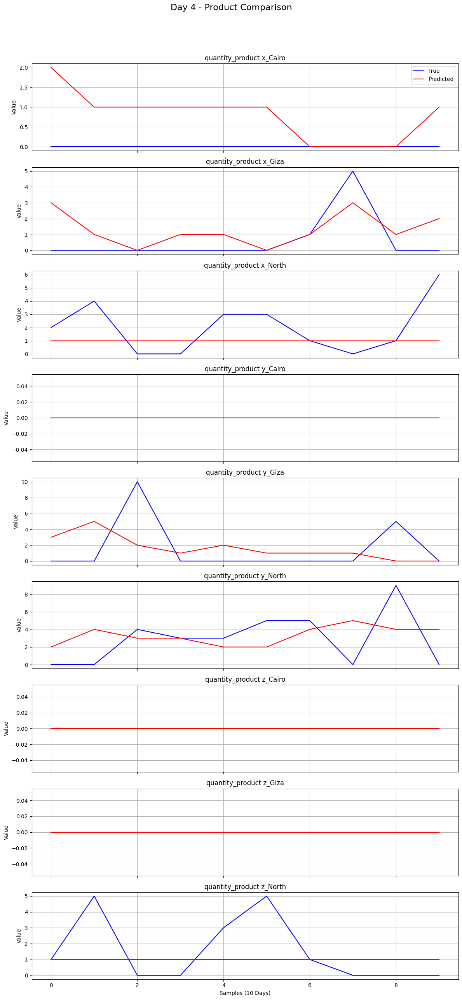


Visualizing results for Day 5 of 10


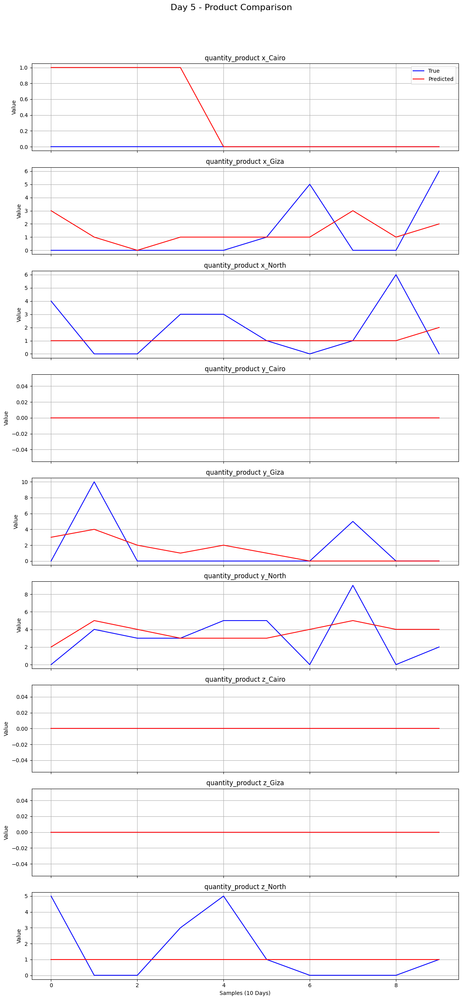


Visualizing results for Day 6 of 10


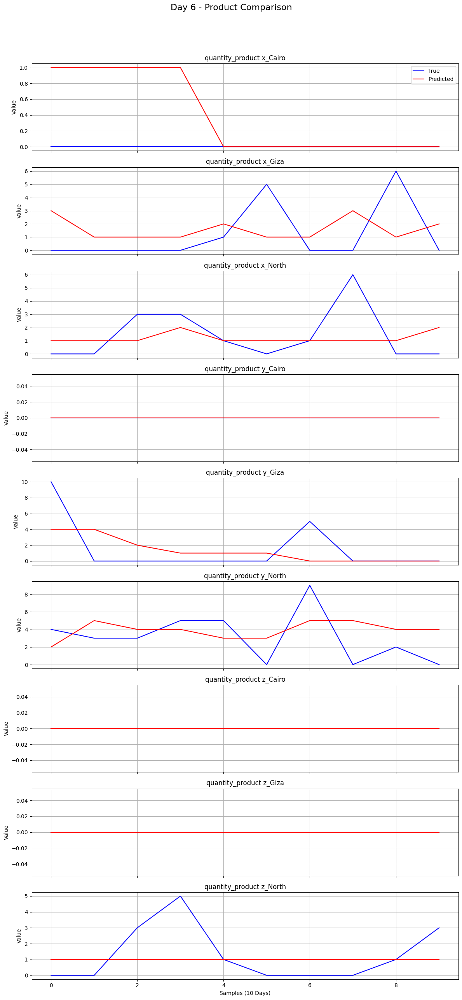


Visualizing results for Day 7 of 10


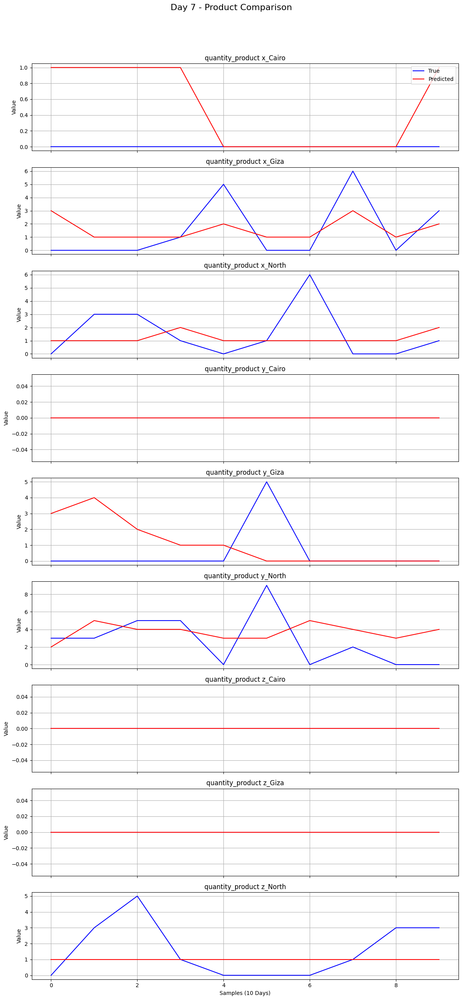


Visualizing results for Day 8 of 10


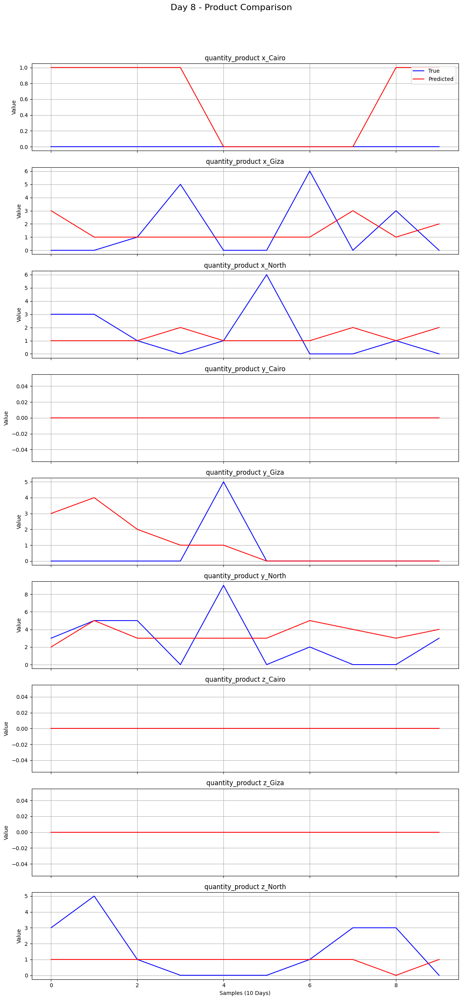


Visualizing results for Day 9 of 10


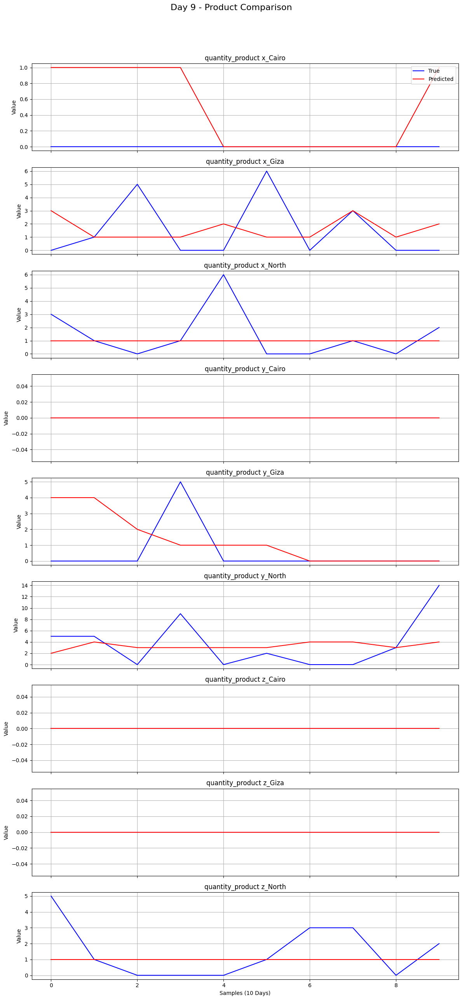


Visualizing results for Day 10 of 10


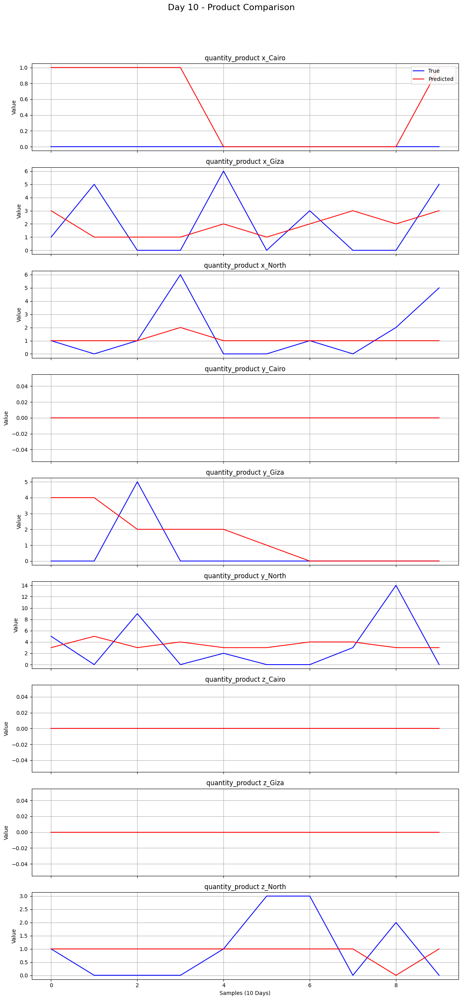

In [113]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

product_names = [
    'quantity_product x_Cairo',
    'quantity_product x_Giza',
    'quantity_product x_North',
    'quantity_product y_Cairo',
    'quantity_product y_Giza',
    'quantity_product y_North',
    'quantity_product z_Cairo',
    'quantity_product z_Giza',
    'quantity_product z_North'
]

# 1. Combine y_test and y_pred for comparison (along the feature axis)
combined = np.concatenate([y_test, y_pred], axis=-1)
print(f"Combined shape: {combined.shape}")

# 2. Compute Root Mean Squared Error (RMSE) for all samples, timesteps, and products
mse = mean_squared_error(
    y_test.reshape(-1, y_test.shape[-1]),
    y_pred.reshape(-1, y_pred.shape[-1]),
    multioutput='uniform_average'
)
print(f"Root Mean Squared Error: {mse**0.5}")

# 3. Compute Mean Absolute Error (MAE) for all samples, timesteps, and products
mae = mean_absolute_error(
    y_test.reshape(-1, y_test.shape[-1]),
    y_pred.reshape(-1, y_pred.shape[-1]),
    multioutput='uniform_average'
)
print(f"Mean Absolute Error: {mae}")

# 4. Visualize comparison by day (all products per day)
samples = y_test.shape[0]  # Number of days
timesteps = y_test.shape[1]
products = y_test.shape[2]

for day in range(timesteps):  # Loop through all days
    print(f"\nVisualizing results for Day {day + 1} of {timesteps}")

    # Create a subplot for all products for the current day
    fig, axes = plt.subplots(nrows=products, ncols=1, figsize=(12, products * 3), sharex=True)
    fig.suptitle(f"Day {day + 1} - Product Comparison", fontsize=16)

    for product_idx, ax in enumerate(axes):  # Loop through all products
        # Plot True values
        ax.plot(range(samples), y_test[:, day, product_idx], label='True', color='blue')

        # Plot Predicted values
        ax.plot(range(samples), y_pred[:, day, product_idx], label='Predicted', color='red')

        # Title and Labels
        ax.set_title(f"{product_names[product_idx]}")
        ax.set_ylabel("Value")
        ax.grid()

    # Common labels
    axes[-1].set_xlabel("Samples (10 Days)")
    axes[0].legend(loc='upper right')

    # Adjust layout and show
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust for title space
    plt.show()


Combined shape: (10, 10, 18)
Root Mean Squared Error: 2.2050447211388304
Mean Absolute Error: 1.086666666666667

Visualizing results for Day 1 of 10


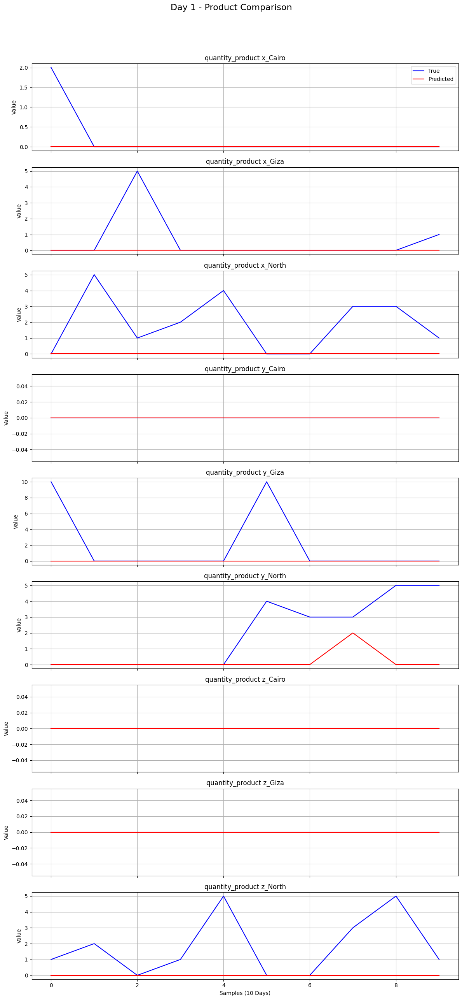


Visualizing results for Day 2 of 10


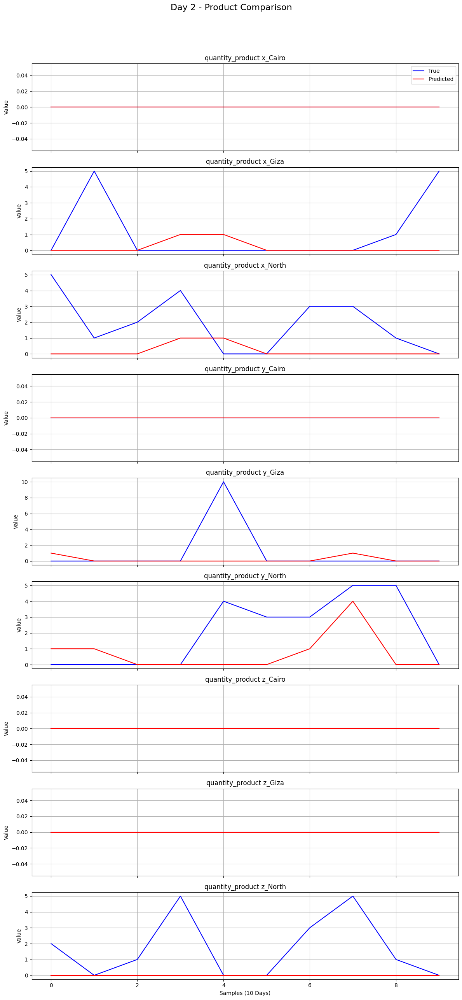


Visualizing results for Day 3 of 10


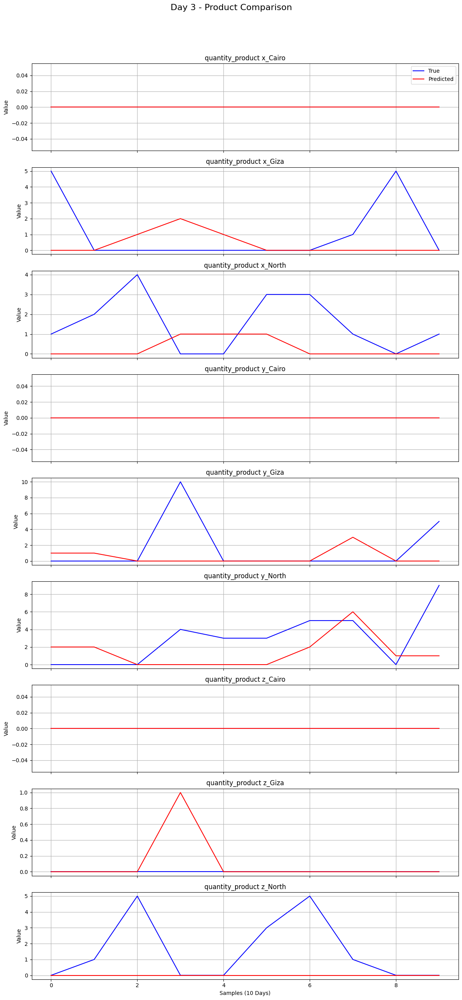


Visualizing results for Day 4 of 10


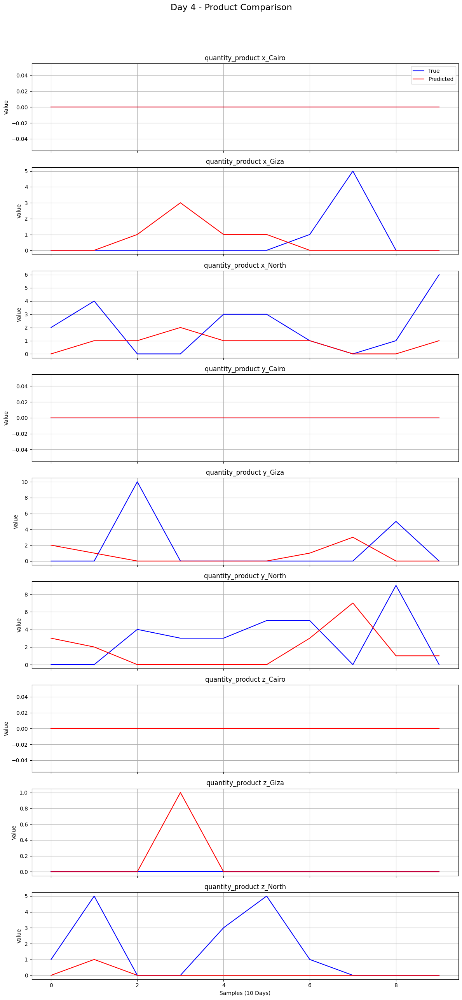


Visualizing results for Day 5 of 10


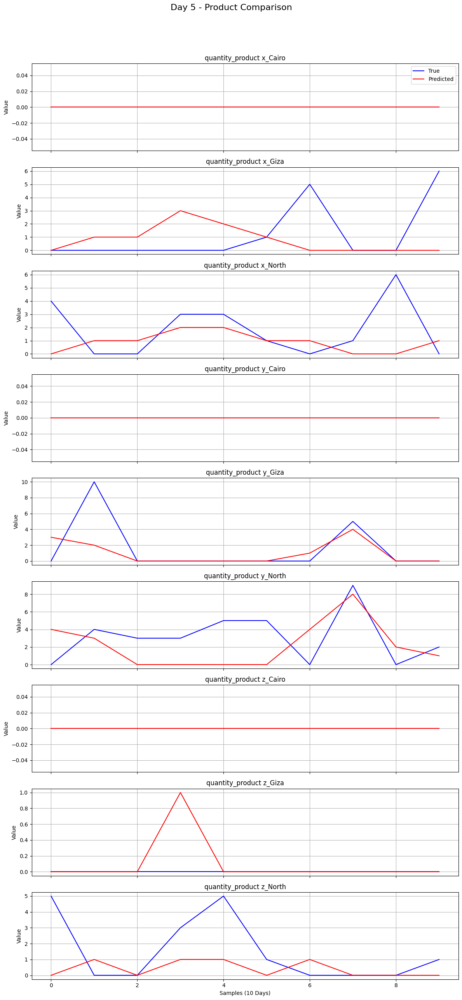


Visualizing results for Day 6 of 10


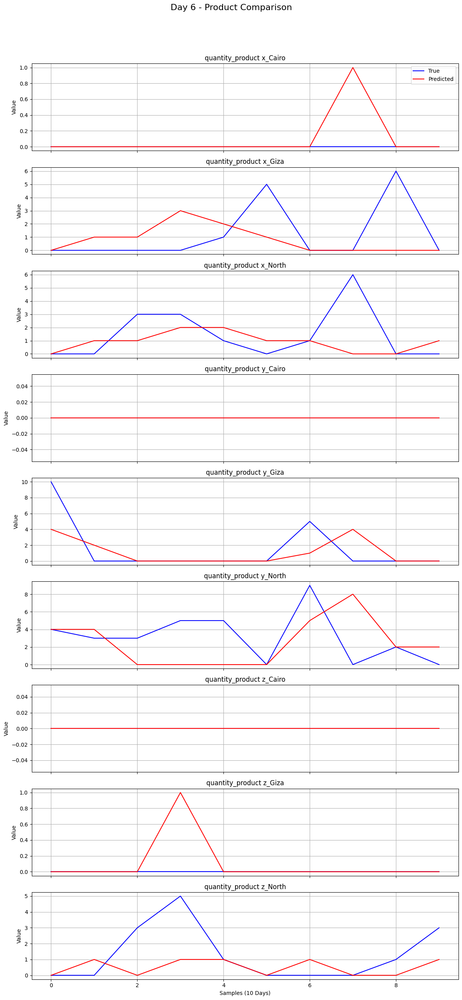


Visualizing results for Day 7 of 10


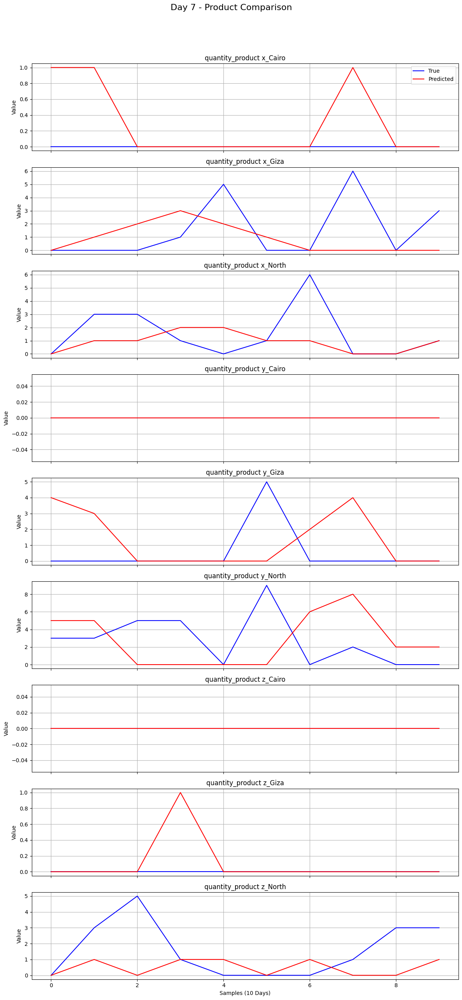


Visualizing results for Day 8 of 10


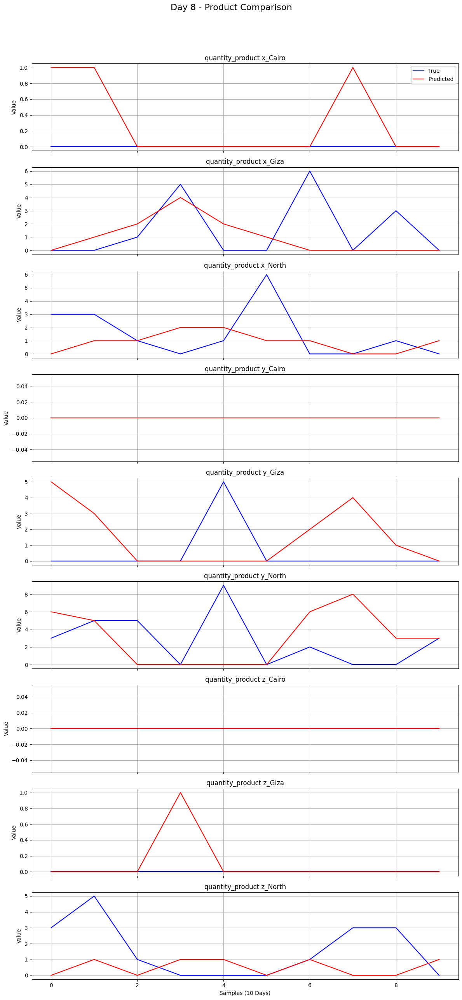


Visualizing results for Day 9 of 10


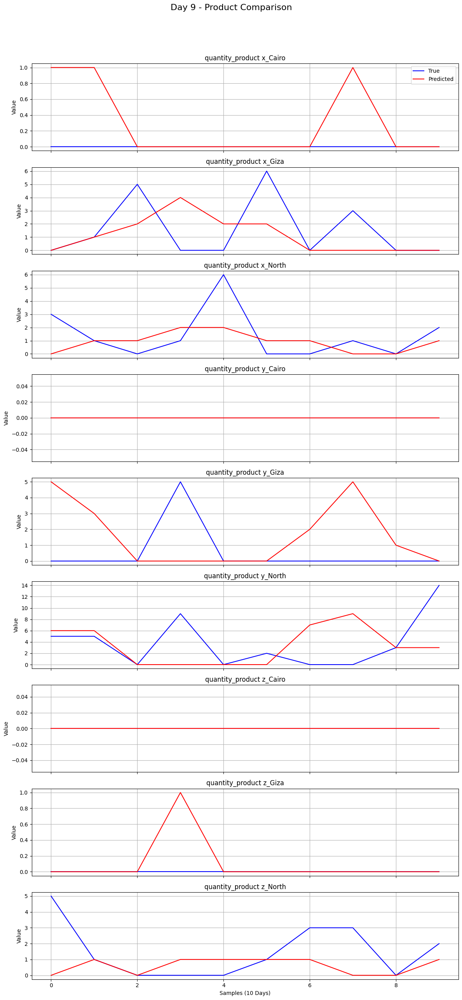


Visualizing results for Day 10 of 10


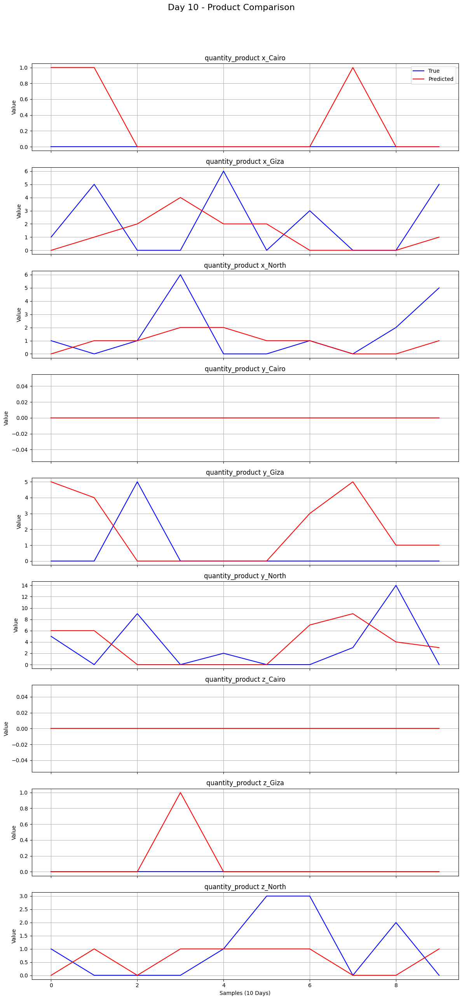

In [109]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

product_names = [
    'quantity_product x_Cairo',
    'quantity_product x_Giza',
    'quantity_product x_North',
    'quantity_product y_Cairo',
    'quantity_product y_Giza',
    'quantity_product y_North',
    'quantity_product z_Cairo',
    'quantity_product z_Giza',
    'quantity_product z_North'
]

# 1. Combine y_test and y_pred for comparison (along the feature axis)
combined = np.concatenate([y_test, y_pred], axis=-1)
print(f"Combined shape: {combined.shape}")

# 2. Compute Root Mean Squared Error (RMSE) for all samples, timesteps, and products
mse = mean_squared_error(
    y_test.reshape(-1, y_test.shape[-1]),
    y_pred.reshape(-1, y_pred.shape[-1]),
    multioutput='uniform_average'
)
print(f"Root Mean Squared Error: {mse**0.5}")

# 3. Compute Mean Absolute Error (MAE) for all samples, timesteps, and products
mae = mean_absolute_error(
    y_test.reshape(-1, y_test.shape[-1]),
    y_pred.reshape(-1, y_pred.shape[-1]),
    multioutput='uniform_average'
)
print(f"Mean Absolute Error: {mae}")

# 4. Visualize comparison by day (all products per day)
samples = y_test.shape[0]  # Number of days
timesteps = y_test.shape[1]
products = y_test.shape[2]

for day in range(timesteps):  # Loop through all days
    print(f"\nVisualizing results for Day {day + 1} of {timesteps}")

    # Create a subplot for all products for the current day
    fig, axes = plt.subplots(nrows=products, ncols=1, figsize=(12, products * 3), sharex=True)
    fig.suptitle(f"Day {day + 1} - Product Comparison", fontsize=16)

    for product_idx, ax in enumerate(axes):  # Loop through all products
        # Plot True values
        ax.plot(range(samples), y_test[:, day, product_idx], label='True', color='blue')

        # Plot Predicted values
        ax.plot(range(samples), y_pred[:, day, product_idx], label='Predicted', color='red')

        # Title and Labels
        ax.set_title(f"{product_names[product_idx]}")
        ax.set_ylabel("Value")
        ax.grid()

    # Common labels
    axes[-1].set_xlabel("Samples (10 Days)")
    axes[0].legend(loc='upper right')

    # Adjust layout and show
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust for title space
    plt.show()


#### Evalution on non-zero metrices

In [114]:
# Check performance on non-zero sales days
#MAE
non_zero_mask = y_test != 0
non_zero_mae = np.mean(np.abs(y_test[non_zero_mask] - y_pred[non_zero_mask]))
print(f"Non-Zero MAE: {non_zero_mae:.2f}")
#RMSE
non_zero_rmse = np.sqrt(np.mean((y_test[non_zero_mask] - y_pred[non_zero_mask]) ** 2))
print(f"Non-Zero RMSE: {non_zero_rmse:.2f}")

Non-Zero MAE: 2.19
Non-Zero RMSE: 3.00


In [118]:
# Check performance on non-zero sales days (seq2seq)
#MAE
non_zero_mask = y_test != 0
non_zero_mae = np.mean(np.abs(y_test[non_zero_mask] - y_pred[non_zero_mask]))
print(f"Non-Zero MAE: {non_zero_mae:.2f}")
#RMSE
non_zero_rmse = np.sqrt(np.mean((y_test[non_zero_mask] - y_pred[non_zero_mask]) ** 2))
print(f"Non-Zero RMSE: {non_zero_rmse:.2f}")


Non-Zero MAE: 3.04
Non-Zero RMSE: 3.86


### Interpretation

*   Model has Low Non-Zero MAE [1->2 ] and good Non-Zero Rmse [3-> ]
means good balance with highly skewed data and show a tradeoff between high performence with actual sales events and sales spikes .
* Here i focused in adapting Rmse i can reduce mae more upto 0.8 .




# Notes



*   Alot of trials not included since it was't effective in model preformence like adding Attention , BILSTM ,Catboost and more models .
*   Some models can be further used like transformer (in such a case i thought it will be overpowered) .

